## **Load and *process* the data**

In [ ]:
import numpy as np
import pandas as pd
import math
from collections import Counter, defaultdict
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap, Normalize
import plotly.express as px
import os
import zipfile
import shutil
import pickle
from pathlib import Path
from PIL import Image
import cv2
import torch
from torch.utils.data import DataLoader
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from google.colab import drive
from tqdm import tqdm
from sklearn.manifold import TSNE
from sklearn.metrics.pairwise import cosine_similarity
from diffusers import StableDiffusionPipeline
# import

## **Load the data from kaggle**

In [ ]:
# Load from Google Drive
drive.mount('/content/drive')
zip_path = '/content/drive/MyDrive/Wheater_Classification/weather-image-classification.zip'  # adjust this path if needed
extract_to = '/content/weather_dataset'
os.makedirs(extract_to, exist_ok=True)
# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print(os.listdir(extract_to))

Mounted at /content/drive
['Wheater_Classification']


In [ ]:
# Load from Google Drive
drive.mount('/content/drive')
zip_path = '/content/weather_dataset/Wheater_Classification/weather-image-classification.zip'  # adjust this path if needed
extract_to = '/content/weather_dataset'
os.makedirs(extract_to, exist_ok=True)
# Unzip the file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_to)
print(os.listdir(extract_to))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['Weather3', 'Wheater_Classification']


In [12]:
# Original directories
data_dir = Path('weather_dataset/Weather3')
train_dir = data_dir / 'train'
test_dir = data_dir / 'test'

# New combined dataset directory
combined_dir = Path('Natural_Phenomena_Dataset')
combined_dir.mkdir(parents=True, exist_ok=True)

# Get class names from train directory
class_names = os.listdir(train_dir)

for class_name in class_names:
    # Create class folder in the new dataset directory
    combined_class_dir = combined_dir / class_name
    combined_class_dir.mkdir(parents=True, exist_ok=True)

    # Paths to current class images in train and test
    train_class_dir = train_dir / class_name
    test_class_dir = test_dir / class_name

    # Copy all train images
    for img_file in os.listdir(train_class_dir):
        src = train_class_dir / img_file
        dst = combined_class_dir / f"train_{img_file}"
        shutil.copy(src, dst)

    # Copy all test images
    for img_file in os.listdir(test_class_dir):
        src = test_class_dir / img_file
        dst = combined_class_dir / f"test_{img_file}"
        shutil.copy(src, dst)

print("Combined dataset created at:", combined_dir)
print("Classes:", os.listdir(combined_dir))

Combined dataset created at: Natural_Phenomena_Dataset
Classes: ['snow', 'wildfire', 'hail', 'fire', 'lightning', 'tsunami', 'waves', 'clouds', 'rain', 'tornado', 'sandstorm']


## **Generate new clasess**

In [ ]:
pip install diffusers transformers accelerate safetensors

In [ ]:
# Load the Diffusion model
pipe1 = StableDiffusionPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",torch_dtype=torch.float16).to("cuda")

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
from diffusers import StableDiffusionImg2ImgPipeline
from PIL import Image
import torch

# Load the image-to-image pipeline
pipe2 = StableDiffusionImg2ImgPipeline.from_pretrained("runwayml/stable-diffusion-v1-5",torch_dtype=torch.float16).to("cuda")

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

#### **Genarate Tornado**

In [ ]:
phenomenon = "tornado"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Define prompt and generate images
prompt = "a narrow shap tornado which is a violently rotating column of air, And objects flying through the air because they got caught in the eye of the storm "
# Generate images
for i in range(220, 240):
    image = pipe1(prompt).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}n_{i}.png"))
print(f"Generated images saved in Drive: {drive_base_path}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
starting_image_path = f"/content/drive/MyDrive/Wheater_Classification/tornado/tornado_00.jpg"
init_image = Image.open(starting_image_path).convert("RGB").resize((512, 512))

phenomenon = "tornado"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Confirm it was created
if os.path.exists(drive_base_path):
    print(f"✅ Folder created or already exists: {drive_base_path}")
else:
    print("❌ Failed to create folder.")

prompt = "a narrow tornado which is a violently rotating column of air, in beackgroud city and buildings"

for i in range(230, 250):
    image = pipe2(prompt=prompt, image=init_image, strength=0.75, guidance_scale=7.5).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))

print(f"Generated images saved in Drive: {drive_base_path}")

✅ Folder created or already exists: /content/drive/MyDrive/Wheater_Classification/tornado


  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

KeyboardInterrupt: 

#### **Genarate Clouds**

In [ ]:
phenomenon = "clouds"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Define prompt and generate images
prompt = "rain clouds or cirrus clouds on blue sky or rainy sky or sunset"
# Generate images
for i in range(170, 500):
    image = pipe1(prompt).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))
print(f"Generated images saved in Drive: {drive_base_path}")

#### **Genarate Tsunami**

In [ ]:
starting_image_path = f"/content/drive/MyDrive/Wheater_Classification/tsunami_example.jpg"
init_image = Image.open(starting_image_path).convert("RGB").resize((512, 512))

phenomenon = "tsunami"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Confirm it was created
if os.path.exists(drive_base_path):
    print(f"✅ Folder created or already exists: {drive_base_path}")
else:
    print("❌ Failed to create folder.")

prompt = "A massive tsunami crash that seen from the street point of view"

for i in range(40, 200):
    image = pipe2(prompt=prompt, image=init_image, strength=0.75, guidance_scale=7.5).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))

print(f"Generated images saved in Drive: {drive_base_path}")

✅ Folder created or already exists: /content/drive/MyDrive/Wheater_Classification/tsunami


  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

  0%|          | 0/37 [00:00<?, ?it/s]

Generated images saved in Drive: /content/drive/MyDrive/Wheater_Classification/tsunami


### **Genarate regular waves**

In [ ]:
phenomenon = "waves"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Define prompt and generate images
prompt = "sea with small waves of without waves with people swimmimg or on the beach, with clear sky or in the rain"
# Generate images
for i in range(350, 500):
    image = pipe1(prompt).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))
print(f"Generated images saved in Drive: {drive_base_path}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

### **Genarate small fire**

In [ ]:
phenomenon = "fire"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Define prompt and generate images
prompt = "flame or a fire match, or cooking fire"
# Generate images
for i in range(200, 250):
    image = pipe1(prompt).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))
print(f"Generated images saved in Drive: {drive_base_path}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated images saved in Drive: /content/drive/MyDrive/Wheater_Classification/fire


### **Genarate wildfire**

In [ ]:
phenomenon = "wildfire"
drive_base_path = f"/content/drive/MyDrive/Wheater_Classification/{phenomenon}"
os.makedirs(drive_base_path, exist_ok=True)
# Define prompt and generate images
prompt = "Image of an uncontrollable wildfire burning down forests or houses"
# Generate images
for i in range(0, 40):
    image = pipe1(prompt).images[0]
    image.save(os.path.join(drive_base_path, f"{phenomenon}_gen_{i}.png"))
print(f"Generated images saved in Drive: {drive_base_path}")

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

Generated images saved in Drive: /content/drive/MyDrive/Wheater_Classification/'wildfire


## **Load generated pics**

In [ ]:
phenomena_list = ['tornado', 'clouds','tsunami', 'waves','fire', 'wildfire']
for phenomenon in phenomena_list:
    drive_dir = f"/content/drive/MyDrive/Wheater_Classification/Wheater_Classification/{phenomenon}"
    local_dir = f"Natural_Phenomena_Dataset/{phenomenon}"
    os.makedirs(local_dir, exist_ok=True)
    image_files = [f for f in os.listdir(drive_dir) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
    # Copy each image
    for file_name in image_files:
        src_path = os.path.join(drive_dir, file_name)
        dst_path = os.path.join(local_dir, file_name)
        shutil.copyfile(src_path, dst_path)
    print(f"Copied {len(image_files)} images to {local_dir}")

Copied 355 images to Natural_Phenomena_Dataset/tornado
Copied 166 images to Natural_Phenomena_Dataset/clouds
Copied 200 images to Natural_Phenomena_Dataset/tsunami
Copied 415 images to Natural_Phenomena_Dataset/waves
Copied 250 images to Natural_Phenomena_Dataset/fire
Copied 643 images to Natural_Phenomena_Dataset/wildfire


## **Create DataLoaders**

In [17]:
# Remove .ipynb_checkpoints in train and test directories
for directory in [train_dir, test_dir]:
    checkpoints_path = os.path.join(directory, '.ipynb_checkpoints')
    if os.path.exists(checkpoints_path):
        shutil.rmtree(checkpoints_path)
        print(f"Removed: {checkpoints_path}")
    else:
        print(f"Not found: {checkpoints_path}")

# Remove all .ipynb_checkpoints folders
for root, dirs, files in os.walk("Natural_Phenomena_Dataset"):
    for d in dirs:
        if d == ".ipynb_checkpoints":
            shutil.rmtree(os.path.join(root, d))

Not found: weather_dataset/Weather3/train/.ipynb_checkpoints
Not found: weather_dataset/Weather3/test/.ipynb_checkpoints


In [18]:
import os
import torch
from torchvision import datasets, transforms
from torch.utils.data import random_split, DataLoader
import pickle

# Paths
dataset_path = "Natural_Phenomena_Dataset"

# Transforms
train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor()
])

test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# Load full dataset with dummy transform (will apply real transforms after splitting)
full_dataset = datasets.ImageFolder(dataset_path, transform=None)

# Split sizes
total_size = len(full_dataset)
train_size = int(0.8 * total_size)
test_size = total_size - train_size

# Split dataset
train_dataset, test_dataset = random_split(full_dataset, [train_size, test_size])

# Apply transforms post-split
train_dataset.dataset.transform = train_transform
test_dataset.dataset.transform = test_transform

# Check classes
class_to_idx = full_dataset.class_to_idx
print("Class to index mapping:", class_to_idx)
print(f"Train samples: {len(train_dataset)}, Test samples: {len(test_dataset)}")

# Save split datasets
with open('train_dataset.pkl', 'wb') as f:
    pickle.dump(train_dataset, f)

with open('test_dataset.pkl', 'wb') as f:
    pickle.dump(test_dataset, f)


Class to index mapping: {'clouds': 0, 'fire': 1, 'hail': 2, 'lightning': 3, 'rain': 4, 'sandstorm': 5, 'snow': 6, 'tornado': 7, 'tsunami': 8, 'waves': 9, 'wildfire': 10}
Train samples: 3871, Test samples: 968


In [ ]:
batch_size = 32
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=2)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False, num_workers=2)

# **Step 1 - EDA**

### Class Distribution
help understand the distribution of images across different classes in the training set. This bar chart will help identify if the dataset **is balanced or if there are classes with significantly more or fewer images.**

In [19]:
from collections import Counter
import plotly.express as px
import pandas as pd

# Define disaster categories
disaster_categories = {'sandstorm', 'lightning', 'tornado', 'tsunami', 'wildfire'}

# Extract class names
class_names = train_dataset.dataset.classes

# Get all targets from both train and test datasets
train_targets = [train_dataset.dataset.targets[i] for i in train_dataset.indices]
test_targets = [test_dataset.dataset.targets[i] for i in test_dataset.indices]
all_targets = train_targets + test_targets

# Count occurrences per class
class_counts = Counter(all_targets)

# Prepare data
data = []
for idx, class_name in enumerate(class_names):
    data.append({
        'class_name': class_name,
        'count': class_counts.get(idx, 0),
        'type': 'Disaster' if class_name in disaster_categories else 'Non-Disaster'
    })

df = pd.DataFrame(data)
df = df.sort_values(by='count', ascending=False)

# Define color mapping
color_map = {
    'Disaster': 'rgb(255, 102, 102)',       # Red shade
    'Non-Disaster': 'rgb(102, 178, 255)'    # Blue shade
}
df['color'] = df['type'].map(color_map)

# Create bar chart
fig = px.bar(
    df,
    x='class_name',
    y='count',
    color='type',
    color_discrete_map=color_map,
    text='count',
    labels={'class_name': 'Weather Phenomenon', 'count': 'Number of Images'},
    title='Total Class Distribution (Train + Test)'
)

# Update layout
fig.update_layout(
    xaxis_tickangle=-45,
    uniformtext_minsize=8,
    uniformtext_mode='show'
)

fig.show()


In [20]:
from collections import Counter
import plotly.express as px

# Define weather disaster categories
disaster_categories = {'sandstorm', 'lightning', 'tornado', 'tsunami', 'wildfire'}

# Extract class names
class_names = train_dataset.dataset.classes

# Extract targets from both train and test datasets
train_targets = [train_dataset.dataset.targets[i] for i in train_dataset.indices]
test_targets = [test_dataset.dataset.targets[i] for i in test_dataset.indices]

# Combine train and test targets
all_targets = train_targets + test_targets

# Count occurrences of each class
class_counts = Counter(all_targets)

# Aggregate counts for disaster and non-disaster
disaster_count = 0
non_disaster_count = 0

for class_idx, count in class_counts.items():
    class_name = class_names[class_idx]
    if class_name in disaster_categories:
        disaster_count += count
    else:
        non_disaster_count += count

# Prepare data for pie chart
labels = ['Weather Disaster', 'Non-Disaster']
values = [disaster_count, non_disaster_count]

# Create pie chart
fig = px.pie(
    names=labels,
    values=values,
    title='Distribution of Disaster vs Non-Disaster Weather Phenomena (Train + Test)',
    color=labels,
    color_discrete_map={
        'Weather Disaster': 'rgb(255, 102, 102)',     # Red shade
        'Non-Disaster': 'rgb(102, 178, 255)'          # Blue shade
    }
)

fig.update_traces(textposition='inside', textinfo='percent+label+value')
fig.show()


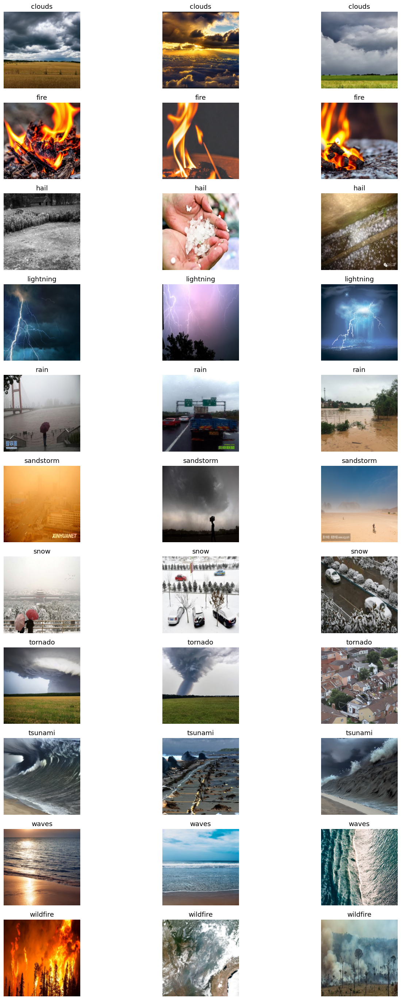

In [ ]:
import matplotlib.pyplot as plt
import random
from torchvision.utils import make_grid

# Number of classes and samples per class to display
samples_per_class = 3
class_names = train_dataset.dataset.classes
class_indices = train_dataset.indices  # indices in the full dataset

# Organize indices by class
from collections import defaultdict
class_to_images = defaultdict(list)
for idx in class_indices:
    label = train_dataset.dataset.targets[idx]
    class_to_images[label].append(idx)

# Plot
num_classes = len(class_names)
plt.figure(figsize=(15, num_classes * 2.5))

plot_idx = 1
for class_idx, class_name in enumerate(class_names):
    # Get indices for this class
    class_imgs = class_to_images[class_idx]
    if len(class_imgs) < samples_per_class:
        continue
    chosen_idxs = random.sample(class_imgs, samples_per_class)

    for i, img_idx in enumerate(chosen_idxs):
        img, _ = train_dataset.dataset[img_idx]
        img = img.permute(1, 2, 0)  # convert CHW to HWC for plt
        plt.subplot(num_classes, samples_per_class, plot_idx)
        plt.imshow(img)
        plt.title(f'{class_name}')
        plt.axis('off')
        plot_idx += 1

plt.tight_layout()
plt.show()


From the Pixel Intensity Histograms for Weather Classes, we can make several important observations about the visual characteristics of each weather condition:

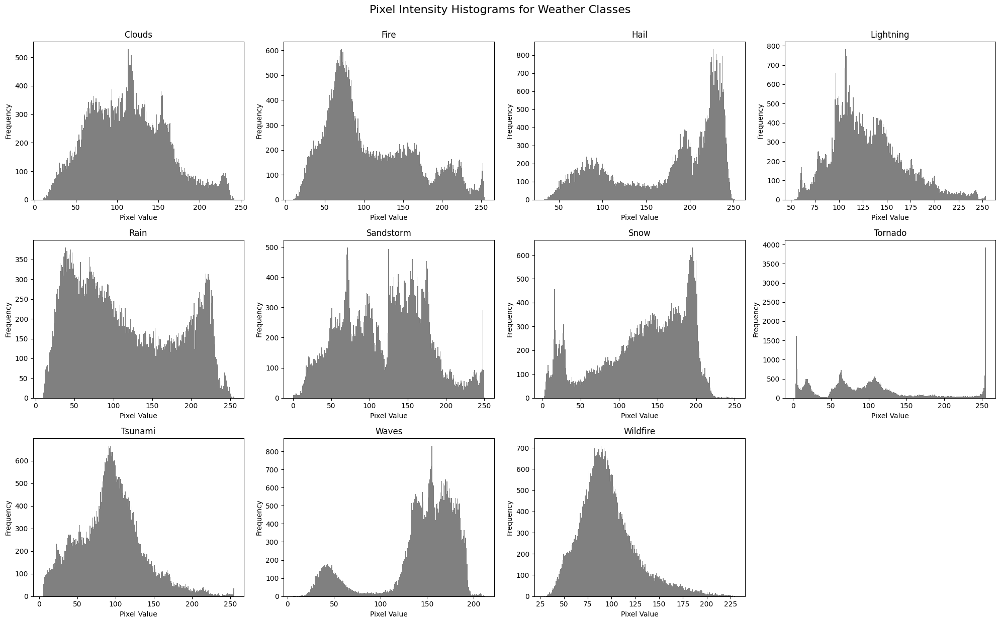

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
import math
from collections import defaultdict, Counter
from torchvision import transforms

def plot_all_class_histograms_from_dataset(dataset):
    # Define disaster categories
    disaster_categories = {'sandstorm', 'lightning', 'tornado', 'tsunami', 'wildfire'}

    # Extract class names
    class_names = dataset.classes

    # Count all targets
    all_targets = dataset.targets
    class_counts = Counter(all_targets)

    # Group indices by class
    class_to_indices = defaultdict(list)
    for i in range(len(dataset)):
        _, label = dataset[i]
        class_to_indices[label].append(i)

    # Plot histograms
    num_classes = len(class_names)
    cols = 4
    rows = math.ceil(num_classes / cols)

    plt.figure(figsize=(5 * cols, 4 * rows))

    for class_idx in range(num_classes):
        if class_idx not in class_to_indices or len(class_to_indices[class_idx]) == 0:
            print(f"No samples found for class: {class_names[class_idx]}")
            continue

        sample_idx = random.choice(class_to_indices[class_idx])
        img_tensor, _ = dataset[sample_idx]
        img_gray = transforms.functional.rgb_to_grayscale(img_tensor, num_output_channels=1)
        img_np = img_gray.squeeze().numpy() * 255  # scale to [0,255]

        plt.subplot(rows, cols, class_idx + 1)
        plt.hist(img_np.ravel(), bins=256, color='gray')
        plt.title(f"{class_names[class_idx].capitalize()}")
        plt.xlabel("Pixel Value")
        plt.ylabel("Frequency")

    plt.tight_layout()
    plt.suptitle("Pixel Intensity Histograms for Weather Classes", fontsize=16, y=1.03)
    plt.show()

plot_all_class_histograms_from_dataset(full_dataset)


From the Pixel Intensity Histograms for Weather Classes, we can make several important observations about the visual characteristics of each weather condition:
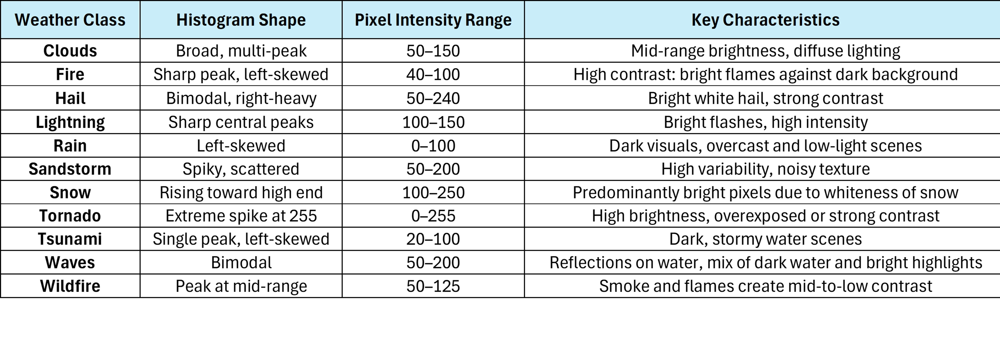


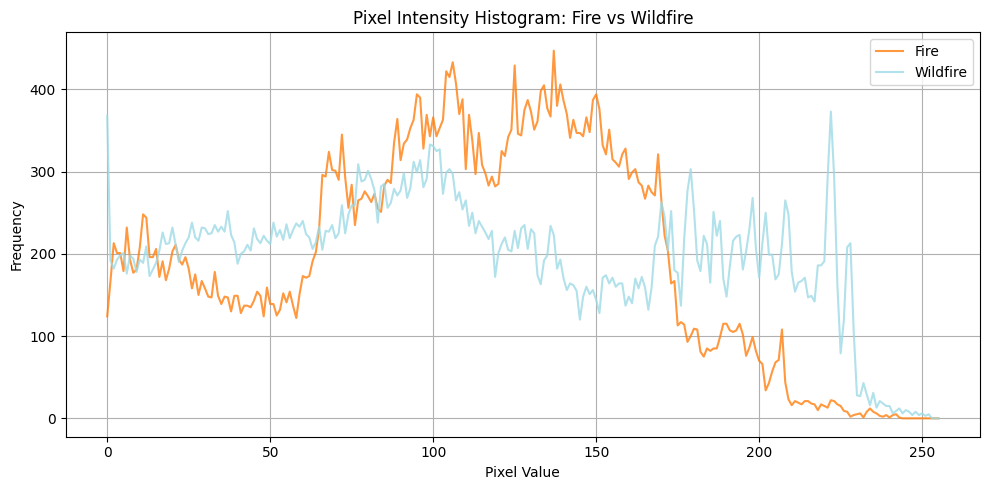

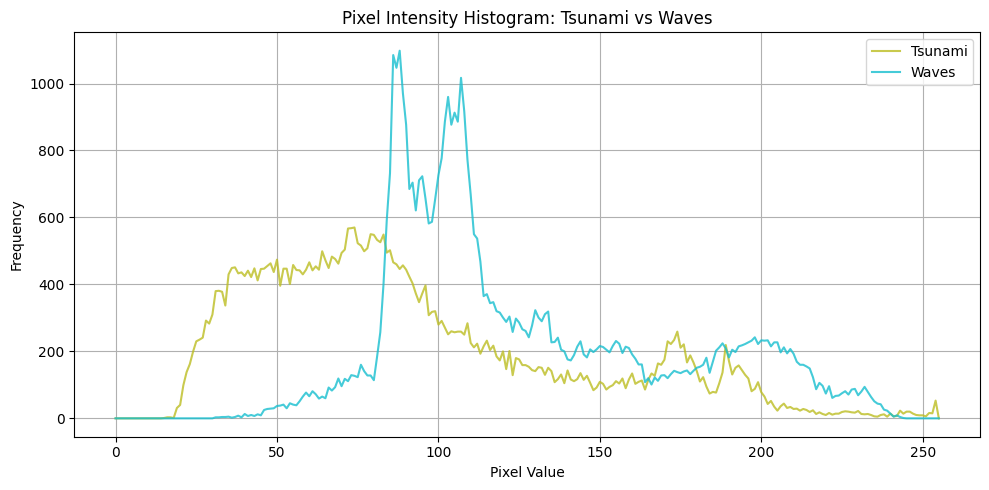

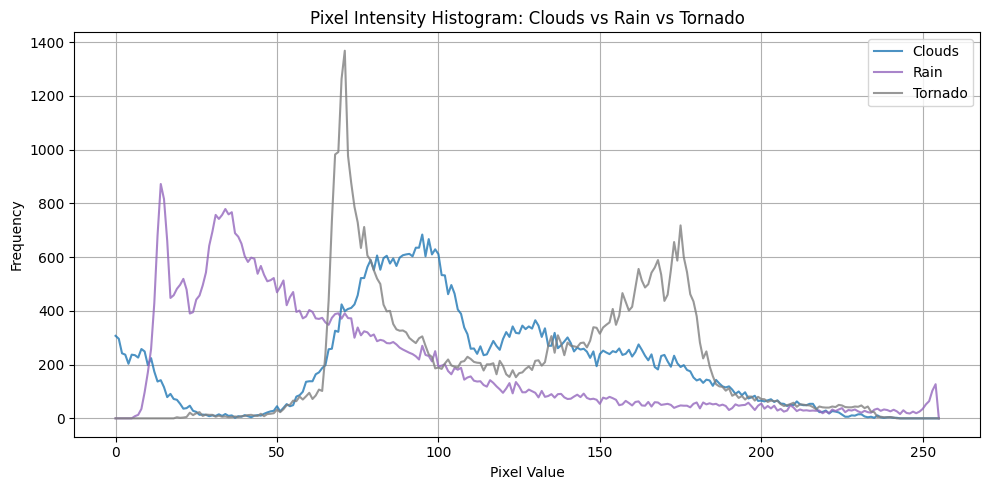

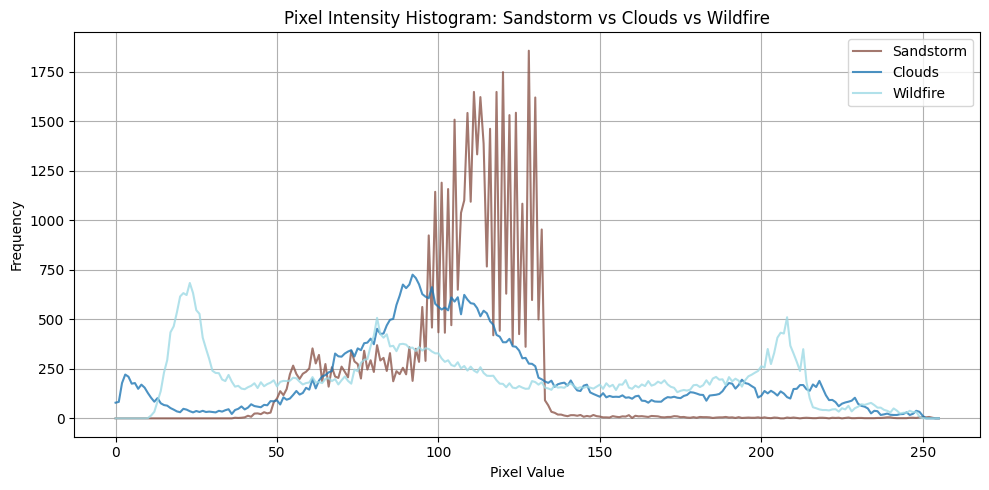

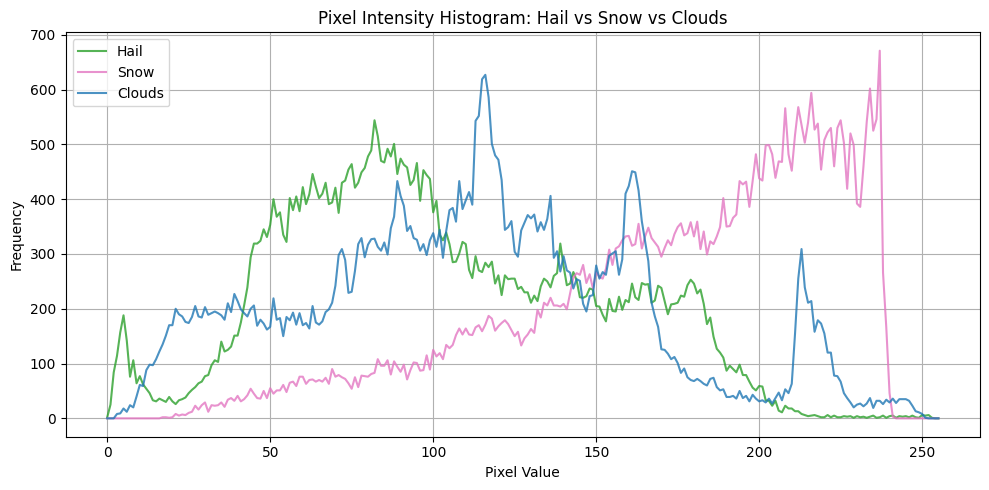

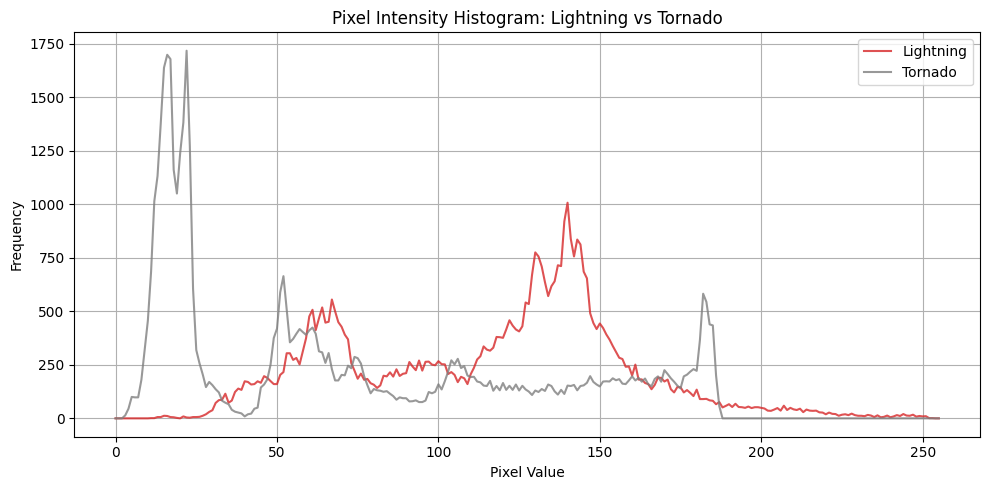

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import random
from collections import defaultdict
from torchvision import transforms

def plot_comparison_groups_colored(dataset):
    # Class names and index mapping
    class_names = dataset.classes
    name_to_index = {name: idx for idx, name in enumerate(class_names)}

    # Fixed color mapping (from uploaded legend)
    class_colors = {
        "clouds": "#1f77b4",
        "fire": "#ff7f0e",
        "hail": "#2ca02c",
        "lightning": "#d62728",
        "rain": "#9467bd",
        "sandstorm": "#8c564b",
        "snow": "#e377c2",
        "tornado": "#7f7f7f",
        "tsunami": "#bcbd22",
        "waves": "#17becf",
        "wildfire": "#9edae5"
    }

    # Comparison groups
    comparison_groups = [
        ["fire", "wildfire"],
        ["tsunami", "waves"],
        ["clouds", "rain", "tornado"],
        ["sandstorm", "clouds", "wildfire"],
        ["hail", "snow", "clouds"],
        ["lightning", "tornado"]
    ]

    class_to_indices = defaultdict(list)
    for i in range(len(dataset)):
        _, label = dataset[i]
        class_to_indices[label].append(i)

    bins = np.arange(257)

    for group in comparison_groups:
        plt.figure(figsize=(10, 5))
        for class_name in group:
            idx = name_to_index.get(class_name)
            if idx is None or idx not in class_to_indices or len(class_to_indices[idx]) == 0:
                print(f"No data for class: {class_name}")
                continue

            sample_idx = random.choice(class_to_indices[idx])
            img_tensor, _ = dataset[sample_idx]
            img_gray = transforms.functional.rgb_to_grayscale(img_tensor, num_output_channels=1)
            img_np = img_gray.squeeze().numpy() * 255

            hist, _ = np.histogram(img_np.ravel(), bins=bins)
            plt.plot(bins[:-1], hist, label=class_name.capitalize(),
                     color=class_colors.get(class_name, 'black'), alpha=0.8)

        title_group = " vs ".join([name.capitalize() for name in group])
        plt.title(f"Pixel Intensity Histogram: {title_group}")
        plt.xlabel("Pixel Value")
        plt.ylabel("Frequency")
        plt.legend()
        plt.grid(True)
        plt.tight_layout()
        plt.show()

# Call the function
plot_comparison_groups_colored(full_dataset)


#**Check the quality and diversity of synthesized data**

Intra-class similarity: Are images within a class similar enough to represent the same phenomenon?


Intra-class diversity: Are they diverse enough not to be duplicates?


Inter-class separability: Are images from different classes distinct from each other?



# **ResNet-50**

In [ ]:
# Initialize the model (ResNet-50)
model = models.resnet50(pretrained=True)
model = torch.nn.Sequential(*list(model.children())[:-1])  # Remove last FC layer
model.eval()

# Path to save embeddings on Google Drive
drive_save_dir = '/content/drive/MyDrive/Wheater_Classification/weather_embeddings'
os.makedirs(drive_save_dir, exist_ok=True)

# Image preprocessing
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [ ]:
def get_embedding(image_path):
    image = Image.open(image_path).convert('RGB')
    image = transform(image).unsqueeze(0)  # Add batch dimension
    with torch.no_grad():
        embedding = model(image).squeeze().flatten()
    return embedding

# Define directories and class names
synthesized_images_dir = 'Natural_Phenomena_Dataset'
class_names = os.listdir(synthesized_images_dir)

# Initialize a dictionary to hold the embeddings for each class
embeddings_by_class = defaultdict(list)

# Loop through each class and save the embeddings
for class_name in class_names:
    class_dir = os.path.join(synthesized_images_dir, class_name)

    # Initialize list to hold embeddings for the current class
    embeddings = []

    print(f"\n🔍 Processing class: {class_name}")

    # Use tqdm for progress bar during image embedding creation
    for fname in tqdm(os.listdir(class_dir), desc=f"Embedding {class_name}"):
        path = os.path.join(class_dir, fname)
        try:
            embedding = get_embedding(path)
            embeddings.append(embedding)
        except Exception as e:
            print(f"⚠️ Skipped {fname} due to error: {e}")

    # Save embeddings for this class to a file in Google Drive
    embedding_filename = os.path.join(drive_save_dir, f'{class_name}_embeddings.pkl')
    with open(embedding_filename, 'wb') as f:
        pickle.dump(embeddings, f)

    # Store embeddings in the dictionary
    embeddings_by_class[class_name] = embeddings

    print(f"✅ Finished processing class: {class_name}. Saved to {embedding_filename}")


🔍 Processing class: rain


Embedding rain: 100%|██████████| 526/526 [01:11<00:00,  7.32it/s]


✅ Finished processing class: rain. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/rain_embeddings.pkl

🔍 Processing class: tsunami


Embedding tsunami: 100%|██████████| 40/40 [00:06<00:00,  6.09it/s]


✅ Finished processing class: tsunami. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/tsunami_embeddings.pkl

🔍 Processing class: tornado


Embedding tornado: 100%|██████████| 70/70 [00:09<00:00,  7.39it/s]


✅ Finished processing class: tornado. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/tornado_embeddings.pkl

🔍 Processing class: waves


Embedding waves: 100%|██████████| 40/40 [00:06<00:00,  6.27it/s]


✅ Finished processing class: waves. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/waves_embeddings.pkl

🔍 Processing class: hail


Embedding hail: 100%|██████████| 591/591 [01:21<00:00,  7.24it/s]


✅ Finished processing class: hail. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/hail_embeddings.pkl

🔍 Processing class: snow


Embedding snow: 100%|██████████| 624/624 [01:24<00:00,  7.35it/s]


✅ Finished processing class: snow. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/snow_embeddings.pkl

🔍 Processing class: sandstorm


Embedding sandstorm: 100%|██████████| 692/692 [01:32<00:00,  7.50it/s]


✅ Finished processing class: sandstorm. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/sandstorm_embeddings.pkl

🔍 Processing class: fire


Embedding fire: 100%|██████████| 60/60 [00:08<00:00,  6.92it/s]


✅ Finished processing class: fire. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/fire_embeddings.pkl

🔍 Processing class: clouds


Embedding clouds: 100%|██████████| 40/40 [00:05<00:00,  6.97it/s]


✅ Finished processing class: clouds. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/clouds_embeddings.pkl

🔍 Processing class: lightning


Embedding lightning: 100%|██████████| 377/377 [00:50<00:00,  7.43it/s]


✅ Finished processing class: lightning. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/lightning_embeddings.pkl

🔍 Processing class: wildfire


Embedding wildfire: 100%|██████████| 40/40 [00:06<00:00,  6.21it/s]


✅ Finished processing class: wildfire. Saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/wildfire_embeddings.pkl
📦 Loaded embeddings for 'rain': 526 images


In [ ]:
def load_embeddings(class_name):
    embedding_path = os.path.join(drive_save_dir, f'{class_name}_embeddings.pkl')
    if os.path.exists(embedding_path):
        with open(embedding_path, 'rb') as f:
            embeddings = pickle.load(f)
        return embeddings
    else:
        print(f"❌ No embeddings found for class: {class_name}")
        return None

In [ ]:
rain_embeddings = load_embeddings('rain')
fire_embbings = load_embeddings('fire')
hail_embeddings = load_embeddings('hail')
lightning_embeddings = load_embeddings('lightning')
sandstorm_embeddings = load_embeddings('sandstorm')
snow_embeddings = load_embeddings('snow')
tornado_embeddings = load_embeddings('tornado')
tsunami_embeddings = load_embeddings('tsunami')
waves_embeddings = load_embeddings('waves')
wildfire_embeddings = load_embeddings('wildfire')
clouds_embeddings = load_embeddings('clouds')

### **Visualize with t-SNE**

In [ ]:
# Reconstruct embeddings_by_class from saved files
drive_save_dir = '/content/drive/MyDrive/Wheater_Classification/weather_embeddings'
class_names = ['rain', 'fire', 'hail', 'lightning', 'sandstorm', 'snow', 'tornado', 'tsunami', 'waves', 'wildfire', 'clouds']

embeddings_by_class = {}

for class_name in class_names:
    embedding_path = os.path.join(drive_save_dir, f'{class_name}_embeddings.pkl')
    if os.path.exists(embedding_path):
        with open(embedding_path, 'rb') as f:
            embeddings_by_class[class_name] = pickle.load(f)
    else:
        print(f"⚠️ Embedding file not found for class: {class_name}")


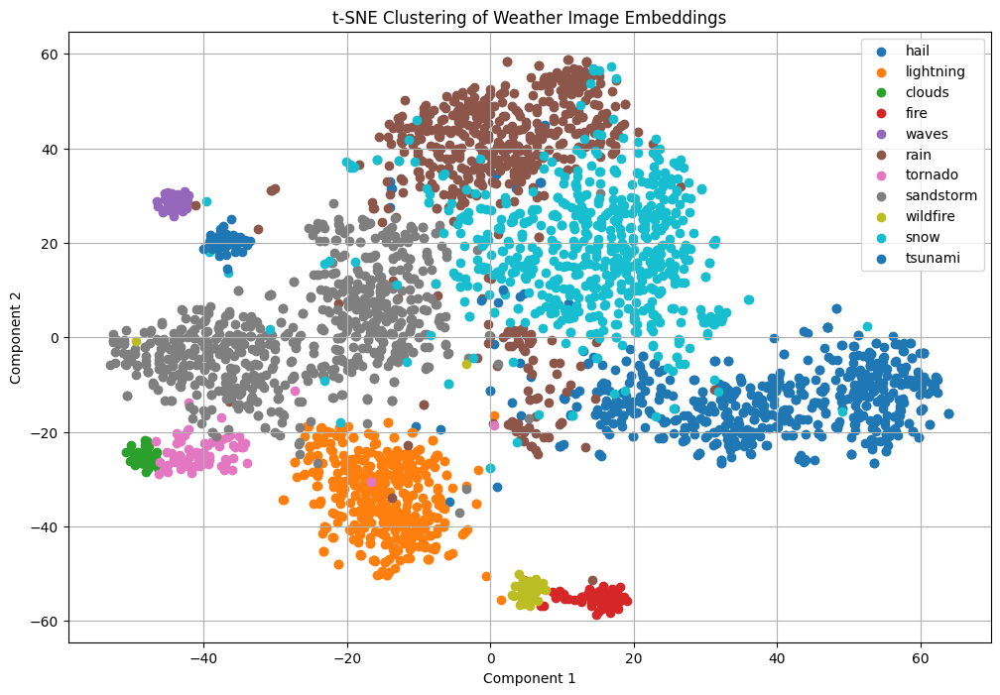

In [ ]:
# Combine embeddings and labels
X = []
y = []

for label, class_name in enumerate(embeddings_by_class.keys()):
    for emb in embeddings_by_class[class_name]:
        X.append(emb.numpy())  # Convert tensor to NumPy
        y.append(class_name)

X = np.vstack(X)  # Convert list of arrays to a single 2D NumPy array

# Project to 2D
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_2d = tsne.fit_transform(X)

# Plot
plt.figure(figsize=(12, 8))
for class_name in set(y):
    idxs = [i for i, label in enumerate(y) if label == class_name]
    plt.scatter([X_2d[i][0] for i in idxs], [X_2d[i][1] for i in idxs], label=class_name)
plt.legend()
plt.title("t-SNE Clustering of Weather Image Embeddings")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.show()


# **CLIP**

In [ ]:
!pip install git+https://github.com/openai/CLIP.git

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-kfjaoalt
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-kfjaoalt
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


In [ ]:
import clip
# Load CLIP model (ViT-B/32) and preprocessing
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
model.eval()

# Path to save embeddings on Google Drive
drive_save_dir = '/content/drive/MyDrive/Wheater_Classification/weather_embeddings'
os.makedirs(drive_save_dir, exist_ok=True)

In [ ]:
def get_embedding(image_path):
    image = preprocess(Image.open(image_path).convert("RGB")).unsqueeze(0).to(device)
    with torch.no_grad():
        image_features = model.encode_image(image).squeeze()
    return image_features.cpu()  # Move to CPU for saving

synthesized_images_dir = 'Natural_Phenomena_Dataset'
class_names = os.listdir(synthesized_images_dir)
embeddings_by_class = defaultdict(list)
# Loop through each class and save the embeddings
for class_name in class_names:
    class_dir = os.path.join(synthesized_images_dir, class_name)
    if not os.path.isdir(class_dir):
        continue  # skip if not a folder
    embeddings = []
    print(f"Processing class: {class_name}")
    image_filenames = sorted(os.listdir(class_dir))  # optional: sort filenames
    for fname in tqdm(image_filenames, desc=f"Embedding {class_name}"):
        path = os.path.join(class_dir, fname)
        try:
            embedding = get_embedding(path)
            embeddings.append(embedding)
        except Exception as e:
            print(f"Failed to process {path}: {e}")

    # Save embeddings to a pickle file
    embedding_filename = os.path.join(drive_save_dir, f'{class_name}_embeddings_CLIP.pkl')
    with open(embedding_filename, 'wb') as f:
        pickle.dump(embeddings, f)
    embeddings_by_class[class_name] = embeddings
    print(f"Finished processing class: {class_name}. Embedding saved to {embedding_filename}.")

Processing class: tornado


Embedding tornado: 100%|██████████| 356/356 [02:11<00:00,  2.71it/s]


Finished processing class: tornado. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/tornado_embeddings_CLIP.pkl.
Processing class: snow


Embedding snow: 100%|██████████| 624/624 [03:07<00:00,  3.33it/s]


Finished processing class: snow. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/snow_embeddings_CLIP.pkl.
Processing class: sandstorm


Embedding sandstorm: 100%|██████████| 692/692 [03:26<00:00,  3.35it/s]


Finished processing class: sandstorm. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/sandstorm_embeddings_CLIP.pkl.
Processing class: clouds


Embedding clouds: 100%|██████████| 166/166 [00:47<00:00,  3.46it/s]


Finished processing class: clouds. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/clouds_embeddings_CLIP.pkl.
Processing class: wildfire


Embedding wildfire: 100%|██████████| 643/643 [03:15<00:00,  3.29it/s]


Finished processing class: wildfire. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/wildfire_embeddings_CLIP.pkl.
Processing class: waves


Embedding waves: 100%|██████████| 415/415 [02:06<00:00,  3.28it/s]


Finished processing class: waves. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/waves_embeddings_CLIP.pkl.
Processing class: fire


Embedding fire: 100%|██████████| 250/250 [01:13<00:00,  3.39it/s]


Finished processing class: fire. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/fire_embeddings_CLIP.pkl.
Processing class: hail


Embedding hail: 100%|██████████| 591/591 [02:42<00:00,  3.65it/s]


Finished processing class: hail. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/hail_embeddings_CLIP.pkl.
Processing class: lightning


Embedding lightning: 100%|██████████| 377/377 [01:42<00:00,  3.66it/s]


Finished processing class: lightning. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/lightning_embeddings_CLIP.pkl.
Processing class: rain


Embedding rain: 100%|██████████| 526/526 [02:24<00:00,  3.63it/s]


Finished processing class: rain. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/rain_embeddings_CLIP.pkl.
Processing class: tsunami


Embedding tsunami: 100%|██████████| 200/200 [00:57<00:00,  3.46it/s]


Finished processing class: tsunami. Embedding saved to /content/drive/MyDrive/Wheater_Classification/weather_embeddings/tsunami_embeddings_CLIP.pkl.


In [ ]:
def load_embeddings_clip(class_name):
    embedding_path = os.path.join(drive_save_dir, f'{class_name}_embeddings_CLIP.pkl')
    if os.path.exists(embedding_path):
        with open(embedding_path, 'rb') as f:
            embeddings = pickle.load(f)
        return embeddings
    else:
        print(f"❌ No embeddings found for class: {class_name}")
        return None

In [ ]:
rain_embeddings_clip = load_embeddings_clip('rain')
fire_embbings_clip = load_embeddings_clip('fire')
hail_embeddings_clip = load_embeddings_clip('hail')
lightning_embeddings_clip = load_embeddings_clip('lightning')
sandstorm_embeddings_clip = load_embeddings_clip('sandstorm')
snow_embeddings_clip = load_embeddings_clip('snow')
tornado_embeddings_clip = load_embeddings_clip('tornado')
tsunami_embeddings_clip = load_embeddings_clip('tsunami')
waves_embeddings_clip = load_embeddings_clip('waves')
wildfire_embeddings_clip = load_embeddings_clip('wildfire')
clouds_embeddings_clip = load_embeddings_clip('clouds')

In [ ]:
# Reconstruct embeddings_by_class from saved files
drive_save_dir = '/content/drive/MyDrive/Wheater_Classification/weather_embeddings'
class_names = ['rain', 'fire', 'hail', 'lightning', 'sandstorm', 'snow', 'tornado', 'tsunami', 'waves', 'wildfire', 'clouds']

embeddings_by_class_clip = {}

for class_name in class_names:
    embedding_path = os.path.join(drive_save_dir, f'{class_name}_embeddings_CLIP.pkl')
    if os.path.exists(embedding_path):
        with open(embedding_path, 'rb') as f:
            embeddings_by_class_clip[class_name] = pickle.load(f)
    else:
        print(f"⚠️ Embedding file not found for class: {class_name}")


<ipython-input-31-e23431bc18dd>:24: MatplotlibDeprecationWarning:

The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.



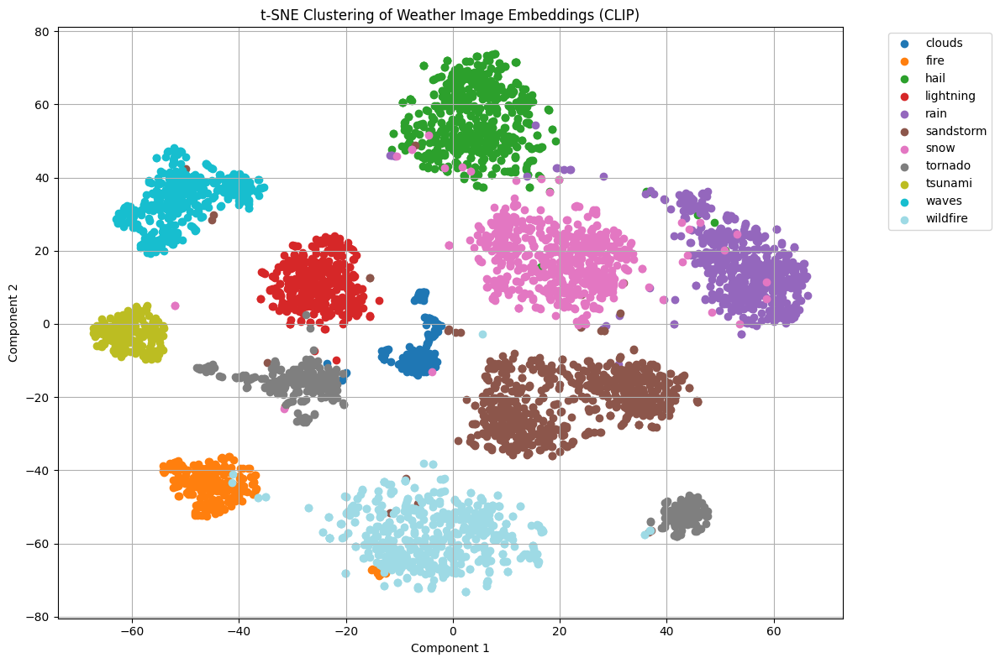

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import matplotlib.cm as cm

# Prepare data
X = []
y = []

for label, class_name in enumerate(embeddings_by_class_clip.keys()):
    for emb in embeddings_by_class_clip[class_name]:
        X.append(emb.numpy())
        y.append(class_name)

X = np.vstack(X)

# Project to 2D with t-SNE
tsne = TSNE(n_components=2, random_state=42, perplexity=30)
X_2d = tsne.fit_transform(X)

# Assign a unique color per class using tab20 colormap
unique_classes = sorted(set(y))
num_classes = len(unique_classes)
colors = cm.get_cmap('tab20', num_classes)

# Plot
plt.figure(figsize=(12, 8))
for i, class_name in enumerate(unique_classes):
    idxs = [j for j, label in enumerate(y) if label == class_name]
    plt.scatter(
        [X_2d[j][0] for j in idxs],
        [X_2d[j][1] for j in idxs],
        label=class_name,
        color=colors(i)
    )

plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.title("t-SNE Clustering of Weather Image Embeddings (CLIP)")
plt.xlabel("Component 1")
plt.ylabel("Component 2")
plt.grid(True)
plt.tight_layout()
plt.show()


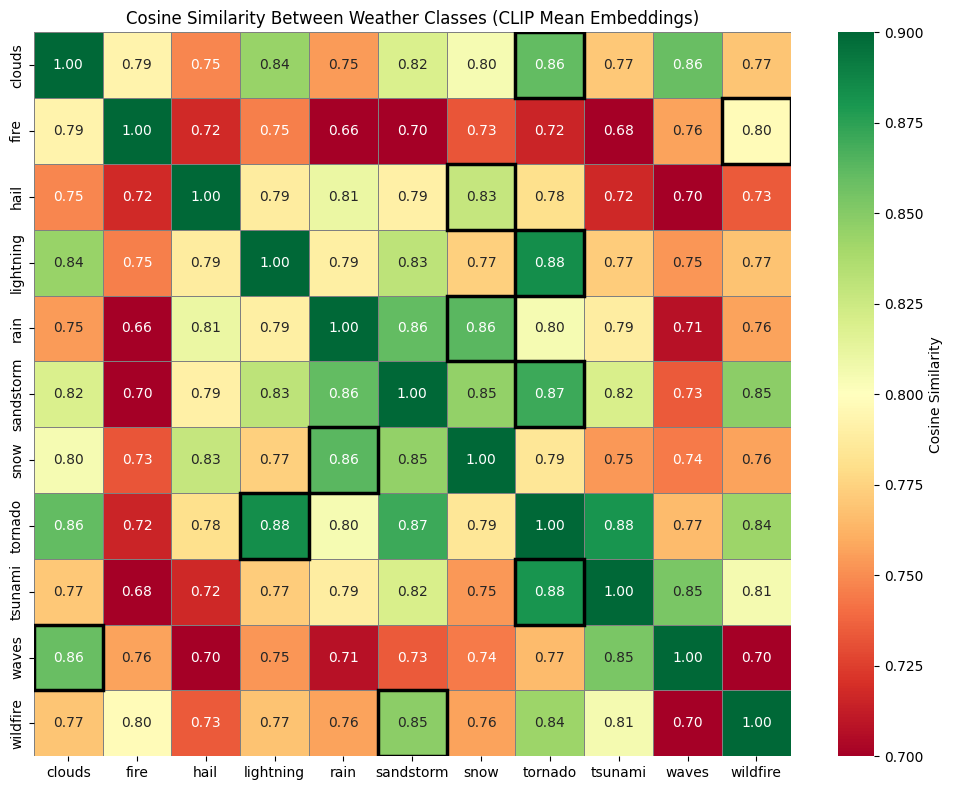

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics.pairwise import cosine_similarity
from matplotlib.patches import Rectangle

# Define the colormap
red_green_cmap = plt.cm.RdYlGn

# Step 1: Compute mean embedding per class
mean_embeddings = []
valid_class_names = []

for class_name in class_names:
    embeddings = embeddings_by_class_clip.get(class_name)
    if embeddings and len(embeddings) > 0:
        mean_embedding = np.mean([e.numpy() for e in embeddings], axis=0)
        mean_embeddings.append(mean_embedding)
        valid_class_names.append(class_name)
    else:
        print(f"⚠️ No embeddings to average for class: {class_name}")

# Step 2: Compute cosine similarity matrix
sim_matrix = cosine_similarity(mean_embeddings)

# Step 3: Find highest non-diagonal similarity per row (to be highlighted)
highlight_cells = []
for i in range(len(sim_matrix)):
    row = sim_matrix[i].copy()
    row[i] = -1  # exclude diagonal
    j = np.argmax(row)
    highlight_cells.append((i, j))

# Step 4: Plot heatmap
plt.figure(figsize=(10, 8))
ax = sns.heatmap(
    sim_matrix,
    xticklabels=valid_class_names,
    yticklabels=valid_class_names,
    cmap=red_green_cmap,
    annot=True,
    fmt=".2f",
    vmin=0.7,
    vmax=0.9,
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={"label": "Cosine Similarity"}
)

# Add bold rectangles around top similarities
for i, j in highlight_cells:
    ax.add_patch(Rectangle((j, i), 1, 1, fill=False, edgecolor='black', lw=2.5))

plt.title("Cosine Similarity Between Weather Classes (CLIP Mean Embeddings)")
plt.tight_layout()
plt.show()


# **Feature engineering --> Add description to the pictures**

In [ ]:
def load_and_shuffle_images(dataset_dir):
    """Load all images and their classes into a shuffled DataFrame."""
    image_data = []

    for class_name in sorted(os.listdir(dataset_dir)):
        class_path = os.path.join(dataset_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        for img_name in sorted(os.listdir(class_path)):
            img_path = os.path.join(class_path, img_name)
            image_data.append({
                "class": class_name,
                "image_name": img_name,
                "image_path": img_path
            })

    df = pd.DataFrame(image_data)
    return df.sample(frac=1).reset_index(drop=True)  # Shuffle

In [ ]:
import os
import random
import pandas as pd
from tqdm import tqdm
from PIL import Image
import torch
import clip

def load_and_shuffle_images(dataset_dir):
    """Load all images and their classes into a shuffled DataFrame."""
    image_data = []

    for class_name in sorted(os.listdir(dataset_dir)):
        class_path = os.path.join(dataset_dir, class_name)
        if not os.path.isdir(class_path):
            continue

        for img_name in sorted(os.listdir(class_path)):
            img_path = os.path.join(class_path, img_name)
            image_data.append({
                "class": class_name,
                "image_name": img_name,
                "image_path": img_path
            })

    df = pd.DataFrame(image_data)
    return df.sample(frac=1).reset_index(drop=True)  # Shuffle


def get_pic_description(df, model, preprocess, descriptions, device):
    """Get CLIP-based descriptions for each image in the DataFrame."""
    # Encode text descriptions
    text_tokens = clip.tokenize(descriptions).to(device)
    with torch.no_grad():
        text_features = model.encode_text(text_tokens)
        text_features /= text_features.norm(dim=-1, keepdim=True)

    results = []

    for i, row in tqdm(df.iterrows(), total=len(df), desc="Describing images"):
        try:
            image = preprocess(Image.open(row["image_path"]).convert("RGB")).unsqueeze(0).to(device)
            with torch.no_grad():
                image_features = model.encode_image(image)
                image_features /= image_features.norm(dim=-1, keepdim=True)

                similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
                top_prob, top_label = similarity[0].topk(1)

            results.append({
                "class": row["class"],
                "image_name": row["image_name"],
                "predicted_description": descriptions[top_label.item()],
                "confidence": top_prob.item()
            })
        except Exception as e:
            print(f"⚠️ Skipped {row['image_name']}: {e}")

    return pd.DataFrame(results)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)
drive_save_dir = '/home/tak/MOJ/denis/Wheater_Classification/weather_embeddings'

# Descriptions list
descriptions = [
    "an intense lightning storm, a natural disaster",
    "a destructive hailstorm damaging property, a natural disaster",
    "a severe rainstorm causing flooding, a natural disaster",
    "a heavy snowstorm disrupting transportation, a natural disaster",
    "a tornado tearing through buildings, a natural disaster",
    "a massive tsunami hitting the coastline, a natural disaster",
    "a raging wildfire spreading in a forest, a natural disaster",
    "a quiet snowy landscape, not a natural disaster",
    "a controlled wildfire in the forest, not a natural disaster",
    "a mild sandstorm in the desert, not a natural disaster",
    "a sunny tropical beach, not a natural disaster",
    "a serene sky with scattered clouds, not a natural disaster",
    "a rainy day in the city, not a natural disaster",
    "a foggy mountain view, not a natural disaster",
    "Single lightning strikes, not a natural disaster",
]

# Step 1: Load and shuffle images
dataset_dir = "Natural_Phenomena_Dataset"
shuffled_df = load_and_shuffle_images(dataset_dir)

# Step 2: Get descriptions
descriptions_df = get_pic_description(shuffled_df, model, preprocess, descriptions, device)
descriptions_df

Describing images: 100%|██████████| 4839/4839 [01:32<00:00, 52.31it/s]


,class,image_name,predicted_description,confidence
0,fire,fire_gen_123.png,"a controlled wildfire in the forest, not a nat...",0.525879
1,sandstorm,train_3356.jpg,"a mild sandstorm in the desert, not a natural ...",0.661133
2,tornado,tornadon_202.png,"a tornado tearing through buildings, a natural...",0.297119
3,snow,train_1076.jpg,"a quiet snowy landscape, not a natural disaster",0.486572
4,hail,train_0530.jpg,"a destructive hailstorm damaging property, a n...",0.987305
...,...,...,...,...
4834,rain,test_141.jpg,"a severe rainstorm causing flooding, a natural...",0.645020
4835,waves,waves_gen_80.png,"a serene sky with scattered clouds, not a natu...",0.773438
4836,waves,waves_gen_349.png,"a sunny tropical beach, not a natural disaster",0.900879
4837,sandstorm,test_3028.jpg,"a massive tsunami hitting the coastline, a nat...",0.233032


In [ ]:
# Map each description to a binary label (1 = natural disaster, 0 = not)
description_to_label = {desc: int("not a natural disaster" not in desc.lower()) for desc in descriptions}

# Add the target_label column to the DataFrame
descriptions_df['description_label'] = descriptions_df['predicted_description'].map(description_to_label)
descriptions_df

,class,image_name,predicted_description,confidence,description_label
0,fire,fire_gen_123.png,"a controlled wildfire in the forest, not a nat...",0.525879,0
1,sandstorm,train_3356.jpg,"a mild sandstorm in the desert, not a natural ...",0.661133,0
2,tornado,tornadon_202.png,"a tornado tearing through buildings, a natural...",0.297119,1
3,snow,train_1076.jpg,"a quiet snowy landscape, not a natural disaster",0.486572,0
4,hail,train_0530.jpg,"a destructive hailstorm damaging property, a n...",0.987305,1
...,...,...,...,...,...
4834,rain,test_141.jpg,"a severe rainstorm causing flooding, a natural...",0.645020,1
4835,waves,waves_gen_80.png,"a serene sky with scattered clouds, not a natu...",0.773438,0
4836,waves,waves_gen_349.png,"a sunny tropical beach, not a natural disaster",0.900879,0
4837,sandstorm,test_3028.jpg,"a massive tsunami hitting the coastline, a nat...",0.233032,1


In [ ]:
descriptions_df[descriptions_df['description_label']== 1]

,class,image_name,predicted_description,confidence,description_label
2,tornado,tornadon_202.png,"a tornado tearing through buildings, a natural...",0.297119,1
4,hail,train_0530.jpg,"a destructive hailstorm damaging property, a n...",0.987305,1
14,rain,train_1823.jpg,"a severe rainstorm causing flooding, a natural...",0.738281,1
15,snow,train_1031.jpg,"a heavy snowstorm disrupting transportation, a...",0.932129,1
16,snow,train_1280.jpg,"a heavy snowstorm disrupting transportation, a...",0.818848,1
...,...,...,...,...,...
4827,rain,train_1448.jpg,"a severe rainstorm causing flooding, a natural...",0.421387,1
4831,hail,train_0194.jpg,"a destructive hailstorm damaging property, a n...",0.989746,1
4834,rain,test_141.jpg,"a severe rainstorm causing flooding, a natural...",0.645020,1
4837,sandstorm,test_3028.jpg,"a massive tsunami hitting the coastline, a nat...",0.233032,1


In [ ]:
# # Flip the target label where confidence < 0.5
# descriptions_df['target_label'] = descriptions_df.apply(
#     lambda row: 1 - row['target_label'] if row['confidence'] < 0.5 else row['target_label'],
#     axis=1
# )

In [ ]:
def compute_brightness_contrast_rgb(image_path):
    image = Image.open(image_path).convert("RGB")
    img_array = np.array(image)

    # Brightness (grayscale mean)
    grayscale = image.convert("L")
    brightness = np.mean(np.array(grayscale))

    # Contrast (std of grayscale)
    contrast = np.std(np.array(grayscale))

    # Average R, G, B
    avg_r = np.mean(img_array[:, :, 0])
    avg_g = np.mean(img_array[:, :, 1])
    avg_b = np.mean(img_array[:, :, 2])

    return brightness, contrast, avg_r, avg_g, avg_b

In [ ]:
def compute_edge_density(image_path):
    image = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
    edges = cv2.Canny(image, threshold1=100, threshold2=200)
    edge_density = np.sum(edges > 0) / edges.size
    return edge_density

In [ ]:
def is_extreme_weather(class_name):
    return int(class_name.lower() in ['sandstorm', 'lightning', 'tornado', 'tsunami','wildfire'])

In [ ]:
def compute_class_description_similarity(class_name, description):
    tokens = clip.tokenize([class_name, description]).to(device)
    with torch.no_grad():
        embeddings = model.encode_text(tokens)
        embeddings = embeddings / embeddings.norm(dim=-1, keepdim=True)

    class_emb, desc_emb = embeddings[0], embeddings[1]
    similarity = (class_emb @ desc_emb).item()
    return similarity

In [ ]:
enhanced_data = []
results = descriptions_df.to_dict(orient='records')

for entry in tqdm(results):
    class_name = entry['class']
    image_name = entry['image_name']
    description = entry['predicted_description']
    image_path = os.path.join(dataset_dir, class_name, image_name)
    try:
        brightness, contrast, avg_r, avg_g, avg_b = compute_brightness_contrast_rgb(image_path)
        edge_density = compute_edge_density(image_path)
        extreme = is_extreme_weather(class_name)
        sim_score = compute_class_description_similarity(class_name, description)
        entry.update({
            'brightness': brightness,
            'contrast': contrast,
            'avg_r': avg_r,
            'avg_g': avg_g,
            'avg_b': avg_b,
            'edge_density': edge_density,
            'class_is_extreme_weather': extreme,
            'class_description_similarity': sim_score
        })
        enhanced_data.append(entry)
    except Exception as e:
        print(f"⚠️ Failed on {image_path}: {e}")

enhanced_df = pd.DataFrame(enhanced_data)

  0%|          | 0/4839 [00:00<?, ?it/s]

 75%|███████▌  | 3652/4839 [01:11<00:30, 38.94it/s]

⚠️ Failed on Natural_Phenomena_Dataset/snow/train_1187.jpg: '>' not supported between instances of 'NoneType' and 'int'


100%|██████████| 4839/4839 [01:35<00:00, 50.68it/s]


In [ ]:
enhanced_df['class_is_extreme_weather'] = enhanced_df['class'].apply(is_extreme_weather)
enhanced_df

,class,image_name,predicted_description,confidence,description_label,brightness,contrast,avg_r,avg_g,avg_b,edge_density,class_is_extreme_weather,class_description_similarity
0,fire,fire_gen_123.png,"a controlled wildfire in the forest, not a nat...",0.525879,0,88.974667,65.190838,125.750179,77.325432,52.512608,0.038662,0,0.859375
1,sandstorm,train_3356.jpg,"a mild sandstorm in the desert, not a natural ...",0.661133,0,70.013577,43.064584,113.693249,57.716433,18.708240,0.025300,1,0.920410
2,tornado,tornadon_202.png,"a tornado tearing through buildings, a natural...",0.297119,1,114.919750,49.903157,115.392479,113.575352,120.540455,0.041187,1,0.854492
3,snow,train_1076.jpg,"a quiet snowy landscape, not a natural disaster",0.486572,0,151.650117,57.347921,156.922232,149.960495,146.532091,0.179881,0,0.910645
4,hail,train_0530.jpg,"a destructive hailstorm damaging property, a n...",0.987305,1,121.680119,55.583891,132.575813,119.197440,105.814761,0.133582,0,0.855957
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4833,rain,test_141.jpg,"a severe rainstorm causing flooding, a natural...",0.645020,1,120.152840,61.678722,114.773015,121.305607,128.277463,0.063704,0,0.888672
4834,waves,waves_gen_80.png,"a serene sky with scattered clouds, not a natu...",0.773438,0,111.073814,59.830951,117.190193,110.113316,99.983650,0.093266,0,0.793457
4835,waves,waves_gen_349.png,"a sunny tropical beach, not a natural disaster",0.900879,0,124.627106,54.228871,104.574062,130.325302,147.872581,0.103336,0,0.832520
4836,sandstorm,test_3028.jpg,"a massive tsunami hitting the coastline, a nat...",0.233032,1,70.166831,37.296029,62.007977,71.949080,82.229423,0.019548,1,0.782715


# **classification model**

In [ ]:
from torch.utils.data import Dataset, DataLoader
import torch
from collections import defaultdict

class MultimodalDataset(Dataset):
    def __init__(self, dataframe, image_embedding_dir, text_model, device):
        self.df = dataframe.reset_index(drop=True)
        self.image_embedding_dir = image_embedding_dir
        self.text_model = text_model
        self.device = device

        # Map from class_name to list of global indices
        self.class_to_indices = defaultdict(list)
        for i, row in self.df.iterrows():
            self.class_to_indices[row['class']].append(i)

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        row = self.df.iloc[idx]
        class_name = row['class']
        image_name = row['image_name']
        desc = row['predicted_description']
        label = row['class_is_extreme_weather']

        # Load image embedding
        image_emb_path = os.path.join(self.image_embedding_dir, f"{class_name}_embeddings_CLIP.pkl")
        with open(image_emb_path, 'rb') as f:
            image_embeddings = pickle.load(f)
        per_class_index = self.class_to_indices[class_name].index(idx)
        image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)

        # Encode description using CLIP and convert to float32
        with torch.no_grad():
            text_token = clip.tokenize([desc]).to(self.device)
            text_embedding = self.text_model.encode_text(text_token)[0]
            text_embedding = text_embedding / text_embedding.norm()
            text_embedding = text_embedding.to(torch.float32)

        # Numerical features (already handled correctly)
        numeric_feats = torch.tensor([
            row['brightness'], row['contrast'],
            row['avg_r'], row['avg_g'], row['avg_b'],
            row['edge_density'], row['class_is_extreme_weather'],
            row['class_description_similarity']
        ], dtype=torch.float32)

        return (
            image_embedding,
            text_embedding.cpu(),  # Move to CPU if model expects it, else remove this
            numeric_feats,
            torch.tensor(label, dtype=torch.long)
        )

In [ ]:
import clip  # if not already imported
text_model, _ = clip.load("ViT-B/32", device=device)
text_model.eval()


CLIP(
  (visual): VisionTransformer(
    (conv1): Conv2d(3, 768, kernel_size=(32, 32), stride=(32, 32), bias=False)
    (ln_pre): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (transformer): Transformer(
      (resblocks): Sequential(
        (0): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          )
          (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
          (mlp): Sequential(
            (c_fc): Linear(in_features=768, out_features=3072, bias=True)
            (gelu): QuickGELU()
            (c_proj): Linear(in_features=3072, out_features=768, bias=True)
          )
          (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
        )
        (1): ResidualAttentionBlock(
          (attn): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
          

In [ ]:
from sklearn.model_selection import train_test_split
drive_save_dir = '/home/tak/MOJ/denis/Wheater_Classification/weather_embeddings'

# Split data
train_df, val_df = train_test_split(enhanced_df, test_size=0.15, stratify=enhanced_df['predicted_description'], random_state=42)
val_df, test_df = train_test_split(val_df, test_size=0.5, random_state=42)

# DataLoaders
train_dataset = MultimodalDataset(train_df, drive_save_dir, text_model, device)
val_dataset = MultimodalDataset(val_df, drive_save_dir, text_model, device)
test_dataset = MultimodalDataset(test_df, drive_save_dir, text_model, device)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)


In [ ]:
from torch import nn
class MultimodalClassifier(nn.Module):
    def __init__(self,
                 image_dim=512,
                 text_dim=512,
                 numeric_dim=8,
                 hidden_dim=256):
        super().__init__()

        # feature extractors for each modality
        self.image_fc   = nn.Linear(image_dim,  hidden_dim)
        self.text_fc    = nn.Linear(text_dim,   hidden_dim)
        self.numeric_fc = nn.Linear(numeric_dim, hidden_dim)

        self.hidden_dim = hidden_dim

        # always expect 3 × hidden_dim after concatenation
        self.classifier = nn.Sequential(
            nn.Linear(hidden_dim * 3, hidden_dim),
            nn.ReLU(),
            nn.Dropout(0.2),
            nn.Linear(hidden_dim, 2)
        )

        self.relu = nn.ReLU()

    def forward(self,
                image_emb=None,
                text_emb=None,
                numeric_feats=None,
                modalities=("image", "text", "numeric")):

        # 1️⃣  find any tensor we actually received
        first_real = next(
            (t for t in (image_emb, text_emb, numeric_feats) if t is not None),
            None
        )
        if first_real is None:
            raise ValueError("No input tensors were provided.")

        batch_size, device = first_real.shape[0], first_real.device
        def zeros_feat():
            return torch.zeros(batch_size, self.hidden_dim, device=device)

        feats = []

        # image branch
        if "image" in modalities and image_emb is not None:
            feats.append(self.relu(self.image_fc(image_emb)))
        else:
            feats.append(zeros_feat())

        # text branch
        if "text" in modalities and text_emb is not None:
            feats.append(self.relu(self.text_fc(text_emb)))
        else:
            feats.append(zeros_feat())

        # numeric branch
        if "numeric" in modalities and numeric_feats is not None:
            feats.append(self.relu(self.numeric_fc(numeric_feats)))
        else:
            feats.append(zeros_feat())

        combined = torch.cat(feats, dim=1)           # (B, hidden_dim * 3)
        return self.classifier(combined)


In [ ]:
import torch.nn.functional as F
from tqdm import tqdm

def train_model(model, train_loader, val_loader, device, modalities=["image", "text", "numeric"], epochs=4):
    model.to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-4)
    criterion = nn.CrossEntropyLoss()
    train_losses, val_losses = [], []

    for epoch in range(epochs):
        model.train()
        total_loss = 0
        train_loop = tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs} [Train - {'+'.join(modalities)}]", leave=False)
        for img, txt, num, label in train_loop:
            inputs = {
                "image_emb": img.to(device) if "image" in modalities else None,
                "text_emb": txt.to(device) if "text" in modalities else None,
                "numeric_feats": num.to(device) if "numeric" in modalities else None,
                "modalities": modalities
            }
            label = label.to(device)
            optimizer.zero_grad()
            output = model(**inputs)
            loss = criterion(output, label)
            loss.backward()
            optimizer.step()
            total_loss += loss.item()
            train_loop.set_postfix(loss=loss.item())

        avg_train_loss = total_loss / len(train_loader)
        train_losses.append(avg_train_loss)

        # Validation
        model.eval()
        val_loss = 0
        correct = 0
        total = 0
        val_loop = tqdm(val_loader, desc=f"Epoch {epoch+1}/{epochs} [Val - {'+'.join(modalities)}]", leave=False)
        with torch.no_grad():
            for img, txt, num, label in val_loop:
                inputs = {
                    "image_emb": img.to(device) if "image" in modalities else None,
                    "text_emb": txt.to(device) if "text" in modalities else None,
                    "numeric_feats": num.to(device) if "numeric" in modalities else None,
                    "modalities": modalities
                }
                label = label.to(device)
                output = model(**inputs)
                loss = criterion(output, label)
                val_loss += loss.item()

                preds = torch.argmax(output, dim=1)
                correct += (preds == label).sum().item()
                total += label.size(0)

                val_loop.set_postfix(loss=loss.item())

        avg_val_loss = val_loss / len(val_loader)
        val_losses.append(avg_val_loss)
        val_acc = correct / total

        print(f"Epoch [{epoch+1}/{epochs}] Train Loss: {avg_train_loss:.4f} | Val Loss: {avg_val_loss:.4f} | Val Acc: {val_acc:.4f}")

    return model, train_losses, val_losses


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate_with_modalities(model, dataloader, device, modalities):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for img, txt, num, label in tqdm(dataloader, desc=f"Evaluating {modalities}"):
            img, txt, num = img.to(device), txt.to(device), num.to(device)
            label = label.to(device)

            kwargs = {
                "image_emb": img if "image" in modalities else None,
                "text_emb": txt if "text" in modalities else None,
                "numeric_feats": num if "numeric" in modalities else None,
                "modalities": modalities
            }
            output = model(**kwargs)
            preds = torch.argmax(output, dim=1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(label.cpu().numpy())

    acc = accuracy_score(all_labels, all_preds)
    prec = precision_score(all_labels, all_preds)
    rec = recall_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds)

    print(f"Modalities: {modalities} | Acc: {acc:.4f} | Prec: {prec:.4f} | Rec: {rec:.4f} | F1: {f1:.4f}")
    return {"acc": acc, "prec": prec, "rec": rec, "f1": f1}


In [ ]:
def plot_loss_curve(train_l, val_l, title="", save_path=None):
    epochs = range(1, len(train_l)+1)
    plt.figure(figsize=(6,4))
    plt.plot(epochs, train_l, label="Train Loss")
    plt.plot(epochs, val_l,   label="Val Loss")
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.title(title or "Training vs Validation Loss")
    plt.legend()
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300)
    plt.show()


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

def plot_loss_curve(
    train_l,
    val_l,
    train_folds=None,         # list-of-lists for per-fold train loss (optional)
    val_folds=None,           # list-of-lists for per-fold val   loss (optional)
    title="Training vs Validation Loss",
    save_path=None,
):
    """
    Draws a “training vs validation loss” chart with a slide-ready aesthetic.

    Parameters
    ----------
    train_l : list[float]
        Mean/primary training loss per epoch.
    val_l   : list[float]
        Mean/primary validation loss per epoch.
    train_folds, val_folds : list[list[float]], optional
        If you ran k-fold CV, pass each fold’s loss history here to draw the
        thin background lines. Length of every inner list must match len(train_l).
    title : str
        Figure title.
    save_path : str, optional
        If given, PNG is saved to this path in 300 dpi.
    """
    epochs = np.arange(1, len(train_l) + 1)

    # ---------- figure & axes ----------
    plt.figure(figsize=(7, 5), dpi=150)      # slightly larger / sharper
    ax = plt.gca()
    ax.set_facecolor("#ffffff")              # clean white canvas
    ax.grid(axis="y", alpha=0.25)            # light horizontal grid

    # ---------- thin per-fold curves ----------
    if train_folds is not None:
        for fold in train_folds:
            ax.plot(epochs, fold, lw=1, color="#d62728", alpha=0.20)
    if val_folds is not None:
        for fold in val_folds:
            ax.plot(epochs, fold, lw=1, color="#1f77b4", alpha=0.20)

    # ---------- bold mean curves ----------
    ax.plot(epochs, train_l, lw=2.5, color="#d62728", label="Mean Train Loss")
    ax.plot(epochs, val_l,   lw=2.5, color="#1f77b4", label="Mean Val Loss")

    # ---------- styling ----------
    ax.set_xlabel("Epochs",   fontsize=11, labelpad=6)
    ax.set_ylabel("Loss",     fontsize=11, labelpad=6)
    ax.set_title(title,       fontsize=13, pad=10, weight="bold")
    ax.tick_params(axis="both", labelsize=10)
    ax.legend(frameon=False, fontsize=9, loc="upper right")

    # ---------- annotation for final gap ----------
    gap = abs(train_l[-1] - val_l[-1])
    ax.annotate(f"Low Overfitting Risk\nFinal Loss Gap = {gap:.3f}",
                xy=(epochs[-1], val_l[-1]),
                xytext=(-80, 40), textcoords="offset points",
                arrowprops=dict(arrowstyle="->", lw=1.2),
                bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="#666", alpha=0.95),
                fontsize=9)

    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches="tight")
    plt.show()


Epoch 1/4 [Train - text]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 0.6412 | Val Loss: 0.5102 | Val Acc: 0.8623


Epoch [2/4] Train Loss: 0.3713 | Val Loss: 0.3073 | Val Acc: 0.8871


Epoch [3/4] Train Loss: 0.2997 | Val Loss: 0.2922 | Val Acc: 0.8926


Epoch [4/4] Train Loss: 0.2913 | Val Loss: 0.2889 | Val Acc: 0.8926


Evaluating ['text']: 100%|██████████| 12/12 [00:11<00:00,  1.08it/s]


Modalities: ['text'] | Acc: 0.8953 | Prec: 0.8728 | Rec: 0.9042 | F1: 0.8882


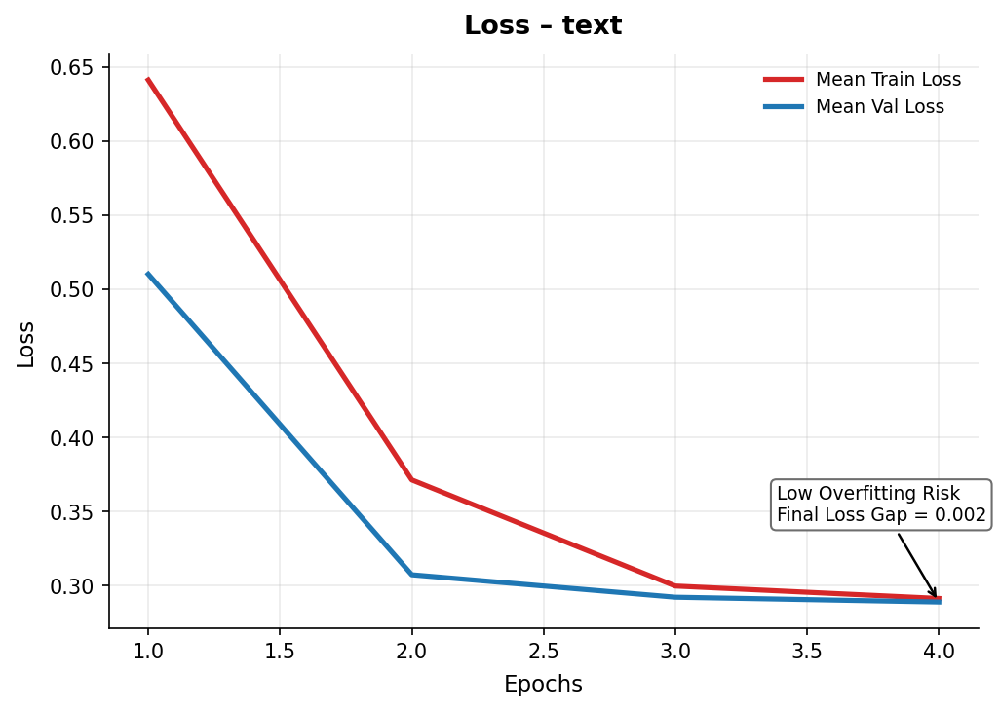

Epoch 1/4 [Train - image+text]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 0.3431 | Val Loss: 0.0376 | Val Acc: 0.9972


Epoch [2/4] Train Loss: 0.0348 | Val Loss: 0.0099 | Val Acc: 1.0000


Epoch [3/4] Train Loss: 0.0187 | Val Loss: 0.0069 | Val Acc: 1.0000


Epoch [4/4] Train Loss: 0.0129 | Val Loss: 0.0047 | Val Acc: 1.0000


Evaluating ['image', 'text']: 100%|██████████| 12/12 [00:11<00:00,  1.07it/s]


Modalities: ['image', 'text'] | Acc: 1.0000 | Prec: 1.0000 | Rec: 1.0000 | F1: 1.0000


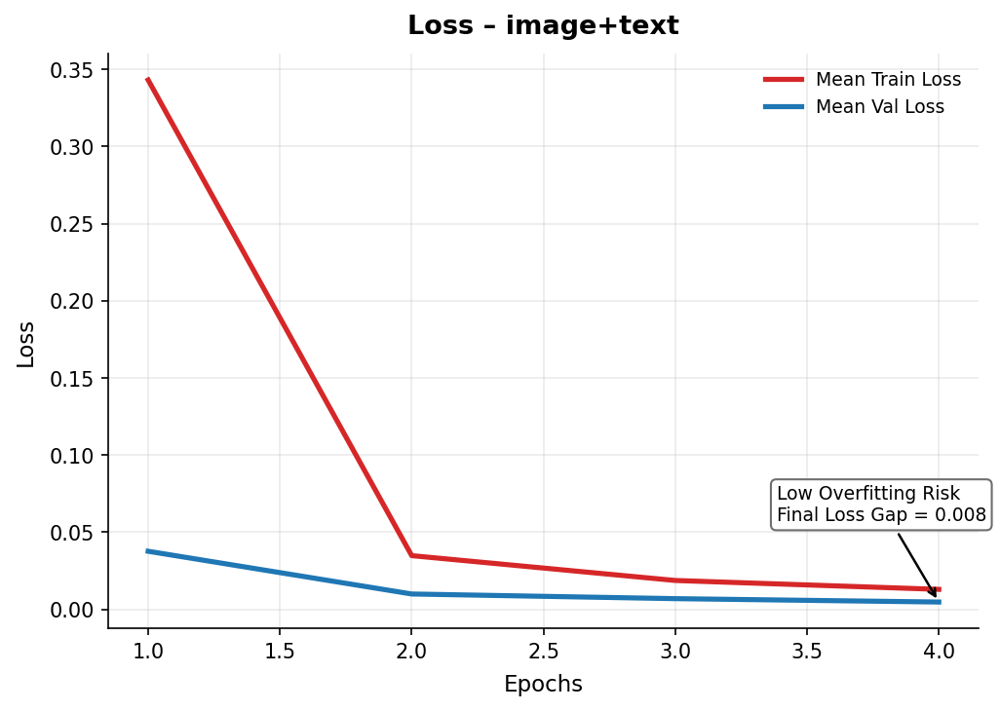

Epoch 1/4 [Train - text+numeric]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 1.6588 | Val Loss: 0.5948 | Val Acc: 0.6997


Epoch [2/4] Train Loss: 0.9160 | Val Loss: 0.4192 | Val Acc: 0.7741


Epoch [3/4] Train Loss: 0.6131 | Val Loss: 0.3631 | Val Acc: 0.8871


Epoch [4/4] Train Loss: 0.4606 | Val Loss: 0.2935 | Val Acc: 0.8898


Evaluating ['text', 'numeric']: 100%|██████████| 12/12 [00:11<00:00,  1.06it/s]


Modalities: ['text', 'numeric'] | Acc: 0.9063 | Prec: 0.8757 | Rec: 0.9281 | F1: 0.9012


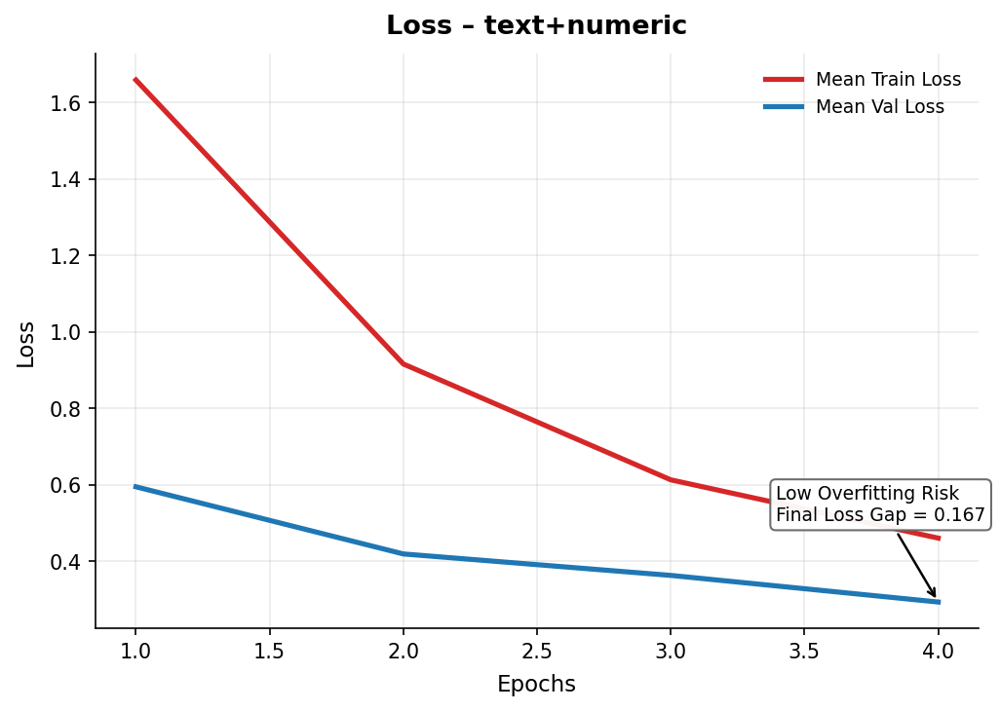

Epoch 1/4 [Train - image]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 0.3572 | Val Loss: 0.0427 | Val Acc: 0.9972


Epoch [2/4] Train Loss: 0.0412 | Val Loss: 0.0120 | Val Acc: 1.0000


Epoch [3/4] Train Loss: 0.0250 | Val Loss: 0.0119 | Val Acc: 1.0000


Epoch [4/4] Train Loss: 0.0177 | Val Loss: 0.0049 | Val Acc: 1.0000


Evaluating ['image']: 100%|██████████| 12/12 [00:11<00:00,  1.07it/s]


Modalities: ['image'] | Acc: 1.0000 | Prec: 1.0000 | Rec: 1.0000 | F1: 1.0000


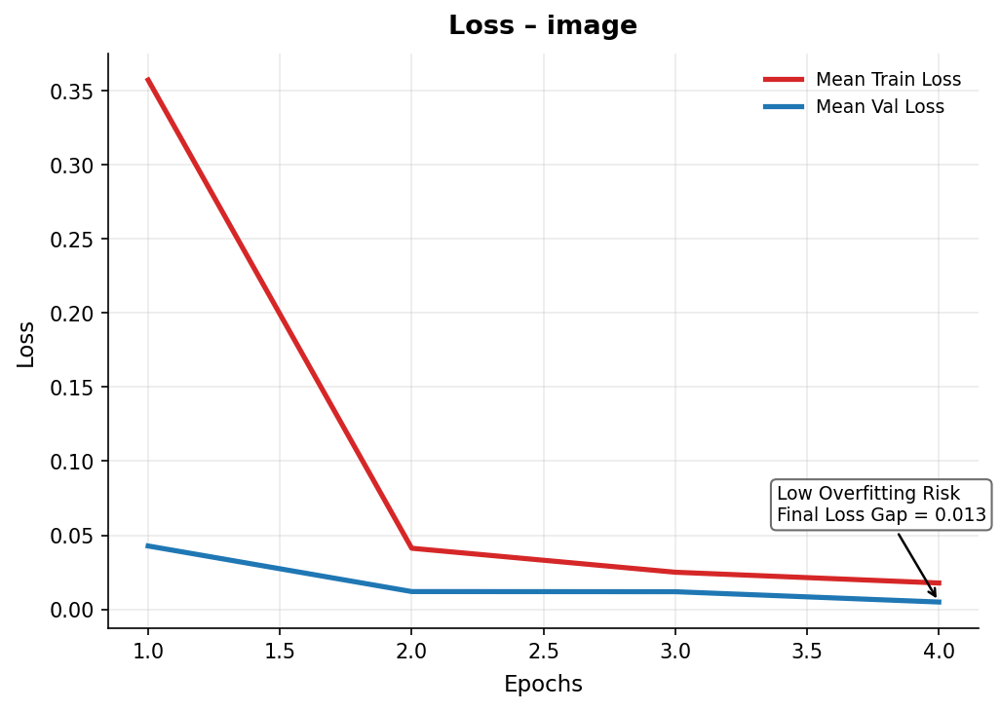

Epoch 1/4 [Train - image+numeric]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 1.2766 | Val Loss: 0.1437 | Val Acc: 0.9890


Epoch [2/4] Train Loss: 0.2528 | Val Loss: 0.0167 | Val Acc: 0.9945


Epoch [3/4] Train Loss: 0.1014 | Val Loss: 0.0071 | Val Acc: 0.9972


Epoch [4/4] Train Loss: 0.0661 | Val Loss: 0.0040 | Val Acc: 1.0000


Evaluating ['image', 'numeric']: 100%|██████████| 12/12 [00:11<00:00,  1.08it/s]


Modalities: ['image', 'numeric'] | Acc: 1.0000 | Prec: 1.0000 | Rec: 1.0000 | F1: 1.0000


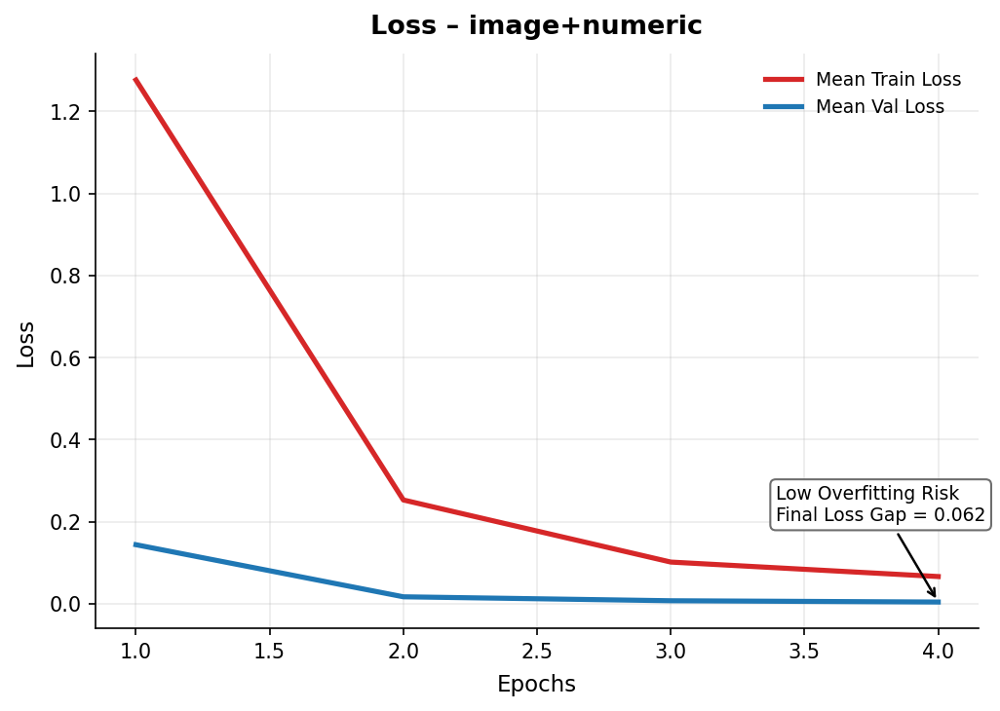

Epoch 1/4 [Train - image+text+numeric]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 1.2518 | Val Loss: 0.3089 | Val Acc: 0.8347


Epoch [2/4] Train Loss: 0.2831 | Val Loss: 0.0220 | Val Acc: 0.9917


Epoch [3/4] Train Loss: 0.1023 | Val Loss: 0.0064 | Val Acc: 1.0000


Epoch [4/4] Train Loss: 0.0553 | Val Loss: 0.0049 | Val Acc: 1.0000


Evaluating ['image', 'text', 'numeric']: 100%|██████████| 12/12 [00:13<00:00,  1.11s/it]


Modalities: ['image', 'text', 'numeric'] | Acc: 1.0000 | Prec: 1.0000 | Rec: 1.0000 | F1: 1.0000


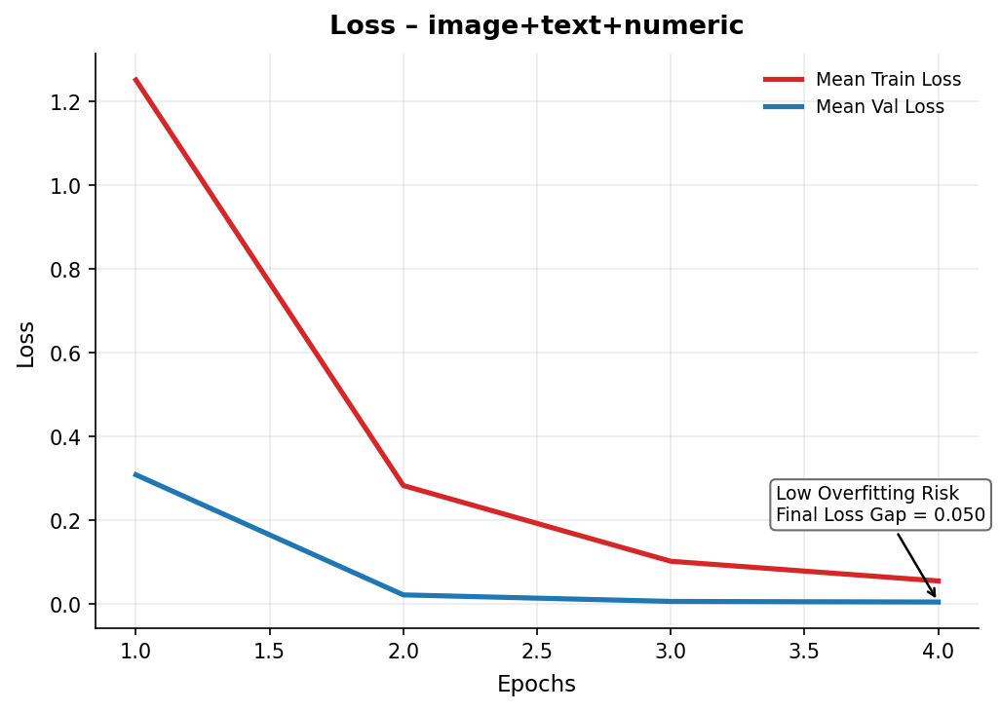

Epoch 1/4 [Train - numeric]:   0%|          | 0/129 [00:00<?, ?it/s]/tmp/ipykernel_864733/636194169.py:32: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  image_embedding = torch.tensor(image_embeddings[per_class_index], dtype=torch.float32)


Epoch [1/4] Train Loss: 1.5714 | Val Loss: 0.9375 | Val Acc: 0.5813


Epoch [2/4] Train Loss: 1.0073 | Val Loss: 0.5686 | Val Acc: 0.6749


Epoch [3/4] Train Loss: 0.7928 | Val Loss: 0.5938 | Val Acc: 0.6832


Epoch [4/4] Train Loss: 0.6849 | Val Loss: 0.5982 | Val Acc: 0.6501


Evaluating ['numeric']: 100%|██████████| 12/12 [00:13<00:00,  1.09s/it]


Modalities: ['numeric'] | Acc: 0.6887 | Prec: 0.8649 | Rec: 0.3832 | F1: 0.5311


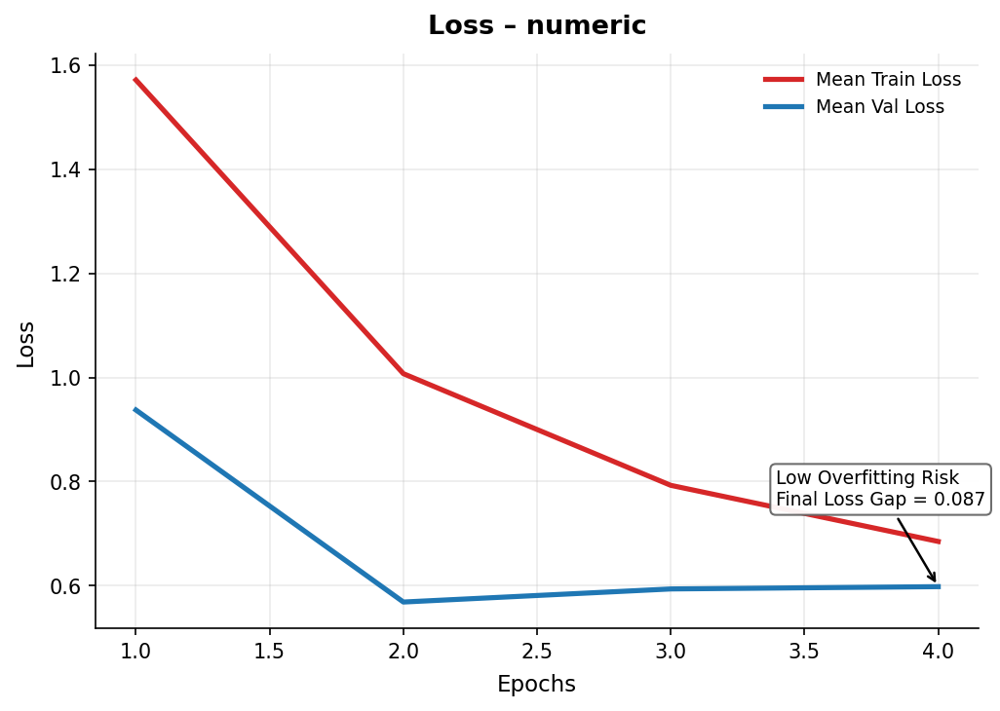

In [ ]:
combinations = [
    ["text"],
    ["image", "text"],
    ["text", "numeric"],
    ["image"],
    ["image", "numeric"],
    ["image", "text", "numeric"],
    ["numeric"]
]

results = {}
loss_curves = {}
for combo in combinations:
    key = "+".join(combo)
    model = MultimodalClassifier()
    trained_model, tr, va = train_model(model, train_loader, val_loader, device, modalities=combo,epochs=4)
    results[key] = evaluate_with_modalities(trained_model, test_loader, device, combo)
    loss_curves[key] = (tr, va)
    plot_loss_curve(tr, va, title=f"Loss – {key}",
                    save_path=f"loss_{key}.png")


In [ ]:
#results from dictionary to DataFrame
#cange headlines to accuracy, precision, recall, f1
import pandas as pd
results_df = pd.DataFrame(results).T
##cange headlines to accuracy, precision, recall, f1
results_df.columns = ['accuracy', 'precision', 'recall', 'f1']
results_df

,accuracy,precision,recall,f1
text,0.895317,0.872832,0.904192,0.888235
image+text,1.000000,1.000000,1.000000,1.000000
text+numeric,0.906336,0.875706,0.928144,0.901163
image,1.000000,1.000000,1.000000,1.000000
image+numeric,1.000000,1.000000,1.000000,1.000000
image+text+numeric,1.000000,1.000000,1.000000,1.000000
numeric,0.688705,0.864865,0.383234,0.531120


# **Visual Classifiers Quality Comparison**

Training ResNet...


/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Epoch 1/5: 100%|██████████| 75/75 [00:16<00:00,  4.46it/s]


Train Loss: 26.6924, Accuracy: 0.8920


Epoch 2/5: 100%|██████████| 75/75 [00:15<00:00,  4.78it/s]


Train Loss: 7.1744, Accuracy: 0.9696


Epoch 3/5: 100%|██████████| 75/75 [00:13<00:00,  5.36it/s]


Train Loss: 3.8031, Accuracy: 0.9865


Epoch 4/5: 100%|██████████| 75/75 [00:13<00:00,  5.60it/s]


Train Loss: 3.6452, Accuracy: 0.9899


Epoch 5/5: 100%|██████████| 75/75 [00:13<00:00,  5.68it/s]


Train Loss: 3.0053, Accuracy: 0.9882
ResNet18 Test Accuracy: 0.9364
              precision    recall  f1-score   support

   lightning       0.93      0.97      0.95        98
        hail       1.00      1.00      1.00        84
   sandstorm       0.78      0.93      0.85        80
        rain       0.98      0.96      0.97       143
        snow       0.97      0.86      0.91       135
     tornado       1.00      0.90      0.95        10

    accuracy                           0.94       550
   macro avg       0.94      0.94      0.94       550
weighted avg       0.94      0.94      0.94       550



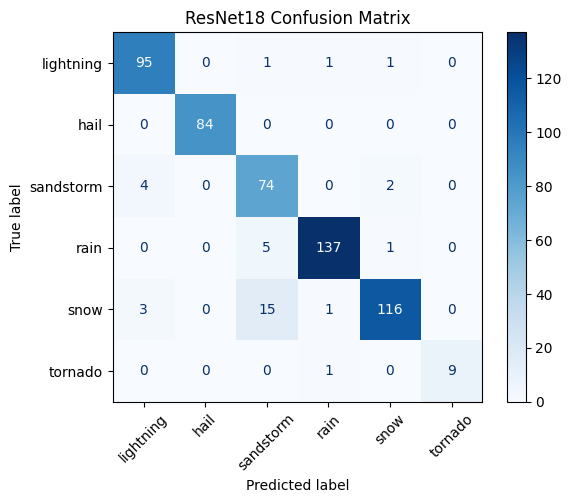

Training EfficientNet...


model.safetensors:   0%|          | 0.00/21.4M [00:00<?, ?B/s]

Epoch 1/5: 100%|██████████| 75/75 [00:14<00:00,  5.06it/s]


Train Loss: 65.2045, Accuracy: 0.7979


Epoch 2/5: 100%|██████████| 75/75 [00:14<00:00,  5.11it/s]


Train Loss: 12.8197, Accuracy: 0.9582


Epoch 3/5: 100%|██████████| 75/75 [00:15<00:00,  4.77it/s]


Train Loss: 6.2231, Accuracy: 0.9802


Epoch 4/5: 100%|██████████| 75/75 [00:14<00:00,  5.02it/s]


Train Loss: 4.6322, Accuracy: 0.9882


Epoch 5/5: 100%|██████████| 75/75 [00:15<00:00,  4.94it/s]

Train Loss: 2.2655, Accuracy: 0.9966


EfficientNet-B0 Test Accuracy: 0.9618
              precision    recall  f1-score   support

   lightning       0.94      1.00      0.97        98
        hail       1.00      1.00      1.00        84
   sandstorm       0.95      0.88      0.91        80
        rain       0.97      0.97      0.97       143
        snow       0.95      0.96      0.95       135
     tornado       1.00      0.90      0.95        10

    accuracy                           0.96       550
   macro avg       0.97      0.95      0.96       550
weighted avg       0.96      0.96      0.96       550



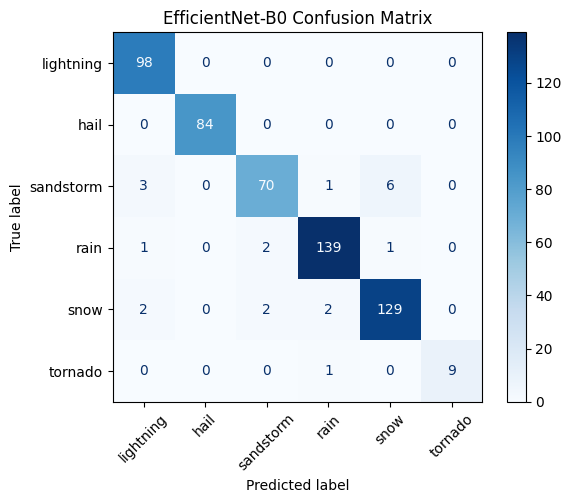

Training Vision Transformer...


model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

Epoch 1/5: 100%|██████████| 75/75 [01:16<00:00,  1.02s/it]


Train Loss: 24.5744, Accuracy: 0.8873


Epoch 2/5: 100%|██████████| 75/75 [01:20<00:00,  1.08s/it]


Train Loss: 5.9136, Accuracy: 0.9726


Epoch 3/5: 100%|██████████| 75/75 [01:20<00:00,  1.08s/it]


Train Loss: 5.6186, Accuracy: 0.9764


Epoch 4/5: 100%|██████████| 75/75 [01:20<00:00,  1.08s/it]


Train Loss: 5.4659, Accuracy: 0.9785


Epoch 5/5: 100%|██████████| 75/75 [01:20<00:00,  1.07s/it]

Train Loss: 4.8244, Accuracy: 0.9806


ViT Test Accuracy: 0.9164
              precision    recall  f1-score   support

   lightning       0.93      0.87      0.90        98
        hail       1.00      0.98      0.99        84
   sandstorm       0.79      0.85      0.82        80
        rain       0.99      0.94      0.96       143
        snow       0.86      0.93      0.90       135
     tornado       1.00      0.80      0.89        10

    accuracy                           0.92       550
   macro avg       0.93      0.90      0.91       550
weighted avg       0.92      0.92      0.92       550



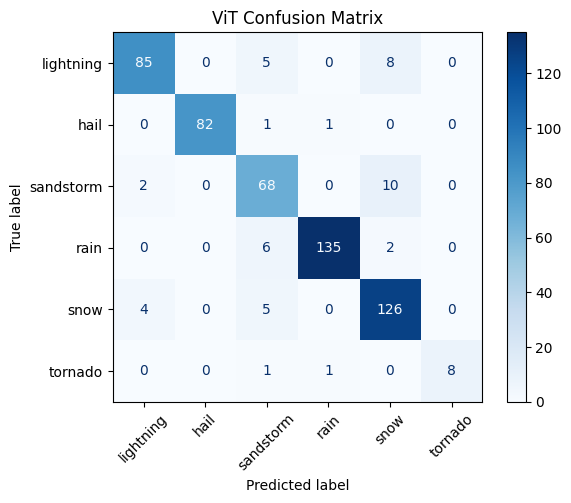


=== Accuracy Comparison ===
ResNet18: 0.9364
EfficientNet-B0: 0.9618
ViT: 0.9164


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
import torchvision.models as models
from torchvision.models import resnet18, efficientnet_b0, vit_b_16
from torch.utils.data import DataLoader
import timm
import open_clip
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay

from tqdm import tqdm
import numpy as np

# ====== Configuration ======
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
NUM_CLASSES = 6
BATCH_SIZE = 32
NUM_EPOCHS = 5
LR = 1e-4
class_names = ['lightning', 'hail', 'sandstorm', 'rain', 'snow', 'tornado']
data_dir = 'Weather3'

# ====== Training Function ======
def train_model(model, train_loader, test_loader, num_epochs=NUM_EPOCHS, lr=LR):
    model = model.to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(num_epochs):
        model.train()
        total_loss = 0
        correct = 0
        total = 0

        for images, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}"):
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            total_loss += loss.item()
            _, predicted = outputs.max(1)
            correct += (predicted == labels).sum().item()
            total += labels.size(0)

        print(f"Train Loss: {total_loss:.4f}, Accuracy: {correct / total:.4f}")

    return model

# ====== Evaluation Function ======
def evaluate_model(model, test_loader, model_name="Model"):
    model.eval()
    model.to(device)
    correct = 0
    total = 0
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for images, labels in test_loader:
            images, labels = images.to(device), labels.to(device)

            outputs = model(images)
            _, predicted = torch.max(outputs, 1)

            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    accuracy = correct / total
    print(f"{model_name} Test Accuracy: {accuracy:.4f}")
    print(classification_report(all_labels, all_preds, target_names=class_names))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
    disp.plot(cmap=plt.cm.Blues, xticks_rotation=45)
    plt.title(f"{model_name} Confusion Matrix")
    plt.show()

    return accuracy

# ====== Model Definitions ======
def get_resnet():
    model = models.resnet18(pretrained=True)
    model.fc = nn.Linear(model.fc.in_features, NUM_CLASSES)
    return model

def get_efficientnet():
    model = timm.create_model('efficientnet_b0', pretrained=True)
    model.classifier = nn.Linear(model.classifier.in_features, NUM_CLASSES)
    return model

def get_vit():
    model = timm.create_model('vit_base_patch16_224', pretrained=True)
    model.head = nn.Linear(model.head.in_features, NUM_CLASSES)
    return model

# ====== Train and Evaluate All Models ======
results = {}

# ResNet
print("Training ResNet...")
resnet = get_resnet()
trained_resnet = train_model(resnet, train_loader, test_loader)
acc_resnet = evaluate_model(trained_resnet, test_loader, "ResNet18")
results['ResNet18'] = acc_resnet

# EfficientNet
print("Training EfficientNet...")
efficientnet = get_efficientnet()
trained_efficientnet = train_model(efficientnet, train_loader, test_loader)
acc_eff = evaluate_model(trained_efficientnet, test_loader, "EfficientNet-B0")
results['EfficientNet-B0'] = acc_eff

# Vision Transformer
print("Training Vision Transformer...")
vit = get_vit()
trained_vit = train_model(vit, train_loader, test_loader)
acc_vit = evaluate_model(trained_vit, test_loader, "ViT")
results['ViT'] = acc_vit

# ====== Compare All Models ======
print("\n=== Accuracy Comparison ===")
for model_name, acc in results.items():
    print(f"{model_name}: {acc:.4f}")